<a href="https://colab.research.google.com/github/PengKuang/wasp-assignmen-af-classification/blob/main/assignment_ecg_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# WASP Course: Artificial Intelligence and Machine Learning

Lecturer: Dave Zachariah

Assignment responsible: Jingwei Hu, Tianru Zhang, David Vävinggren

# Student and Group Information

Fill this out for the submission of the assignment (you submit this notebook with your solution)

- **Student names:** <font color='red'>Peng Kuang</font>

- **Team ID:** <font color='red'>LundBooster</font>

Make sure that the team id is the same as the one with which you submit your model predictions (see coding task 7) such that we can check your performance.

---
# Module 3 - Assignment Overview: ECG classification

The [electrocardiogram (ECG)](https://www.mayoclinic.org/tests-procedures/ekg/about/pac-20384983) records the electrical signals in the heart. It is a common  test used to quickly detect heart problems and to monitor the heart's health.
In this assignment you will implement and evaluate a model to classify whether the person has [atrial fibrillation (AF)](https://www.mayoclinic.org/diseases-conditions/atrial-fibrillation/symptoms-causes/syc-20350624.) or not based on measurements from the ECG exam.


**Submission:** You submit the deliverables (see below) at https://canvas.kth.se/courses/54581/assignments

**Due Date:** August 22, 2025.

---
## Basic Tasks
Your task is to implement a classification model, train this model on training data, and evaluate its performance on validation data. We provide skeleton code for the implementation of a simple convolution neural network model.

The steps required to implement this model are presented as numbered tasks below. In total there are seven (7) coding tasks and five (5) explanation tasks.

## Competitive setting

You have to compute the predictions for the test data (you do not have the labels for it) and submit your predictions to be evaluated to a leaderboard. These predictions will be scored and your submission will be ranked according to the F1 score and compared with your colleagues. In the end a winning team will be determined.

### Deliverables
There are two deliverables:
1. You have to submit this Jupyter notebook on the course web-page (Canvas) together with your code and explanations (where asked for it) that describe your implementation and your experimental results. The notebook should run as a standalone in google colab.
2. You have to have at least **three (3)** submissions (for instructions on how to submit, see coding task 7) where you try to improve the model architecture, the training procedure or the problem formulation. In the submission of this notebook you have to provide a short explanation of what changed between each submission and justify why you decided to make these changes.

### Grading
To pass the assignment, you must submit a complete and working implementation of a model and a well-motivated description and evaluation of it. Your model should reach an Area under the ROC curve (AUROC) on the test data of at least 0.97 and an Average Precision (AP) score of 0.95. Note that the leaderboard to is sorted by F1 score and not AUROC, hence you would want to balance all three metrics.

### GPU Acceleration
To be able to use the GPUs provided by colab in order to speed up your computations, you want to check that the `Hardware accelerator` is set to `GPU` under `Runtime > change runtime type`. Note that notebooks run by connecting to virtual machines that have maximum lifetimes that can be as much as 12 hours. Notebooks will also disconnect from VMs when left idle for too long.

In [1]:
import os

# helper function
def exists(path):
    val = os.path.exists(path)
    if val:
        print(f'{path} already exits. Using cached. Delete it manually to recieve it again!')
    return val

# clone requirements.txt if not yet available
if not exists('requirements.txt'):
    !git clone https://gist.github.com/dgedon/8a7b91714568dc35d0527233e9ceada4.git req
    !mv req/requirements.txt .
    !yes | rm -r req

requirements.txt already exits. Using cached. Delete it manually to recieve it again!


In [2]:
# Install packages (python>=3.9 is required)
!pip install -r requirements.txt

In [3]:
# Import
import torch
import torch.nn as nn
import numpy as np
from tqdm.notebook import trange, tqdm
import h5py
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

---
## The data set

The dataset is a subset of the [*CODE dataset*](https://scilifelab.figshare.com/articles/dataset/CODE_dataset/15169716): an anotated database of ECGs. The ECG exams were recorded in Brazil by the Telehealth Network of the state Minas Gerais between 2010 and 2016. The dataset and its usage for the development of deep learning methods was described in ["Automatic diagnosis of the 12-lead ECG using a deep neural network"](https://www.nature.com/articles/s41467-020-15432-4).
The full dataset is available for research upon request.


For the training dataset you have labels.
For the test dataset you only have the ECG exams but no labels. Evaluation is done by submitting to the leaderboard.

Download the dataset from the given dropbox link and unzip the folder containing the files. The downloaded files are in WFDB format (see [here](https://www.physionet.org/content/wfdb-python/3.4.1/) for details).

In [4]:
import os

# helper function
def exists(path):
    val = os.path.exists(path)
    if val:
        print(f'{path} already exits. Using cached. Delete it manually to recieve it again!')
    return val

# 1. Download dataset
if not exists('codesubset.tar.gz'):
    !wget https://www.dropbox.com/s/9zkqa5y5jqakdil/codesubset.tar.gz?dl=0 -O codesubset.tar.gz

codesubset.tar.gz already exits. Using cached. Delete it manually to recieve it again!


In [32]:
# 1. unzip the downloaded data set folder
if not exists('codesubset'):
    !tar -xf codesubset.tar.gz

codesubset already exits. Using cached. Delete it manually to recieve it again!


Note that the extraced folder 'codesubset' contains
1. subfolders with the ECG exam traces. These have to be further preprocessed which we do in the next steps.
2. a csv file which contain the labels and other features for the training data set.


### Preprocessing

Run the cells below to  Clone the GitHub repository which we use for [data preprocessing](https://github.com/antonior92/ecg-preprocessing).

In [6]:
# 2. clone the code files for data preprocessing
if not exists('ecg-preprocessing'):
    !git clone https://github.com/paulhausner/ecg-preprocessing.git

ecg-preprocessing already exits. Using cached. Delete it manually to recieve it again!


Let us plot an ECG sample. We can plot ECGs using the `ecg_plot` library for example by using the following code snippet where `ecg_sample` is an array of size `(number of leads * sequence length)`. Now we can view an ECG before preprocessing.

<Figure size 640x480 with 0 Axes>

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

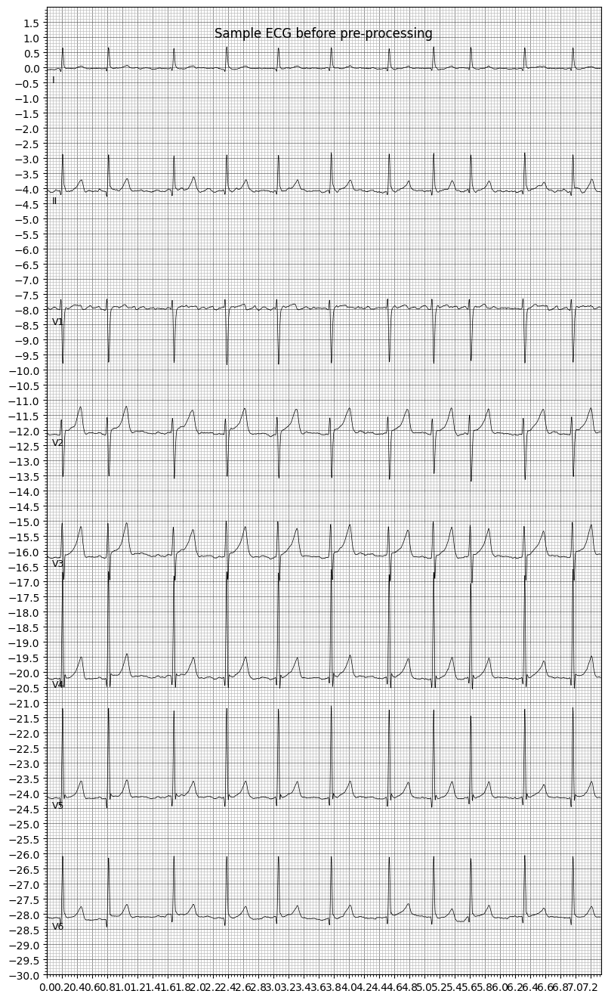

In [7]:
import ecg_plot
runfile("ecg-preprocessing/read_ecg.py")

PATH_TO_WFDB = 'codesubset/train/TNMG100046'
ecg_sample, sample_rate, _ = read_ecg(PATH_TO_WFDB)

# ECG plot
plt.figure()
lead = ['I', 'II', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
ecg_plot.plot(ecg_sample, sample_rate=sample_rate, style='bw', row_height=8, lead_index=lead, columns=1, title='Sample ECG before pre-processing')
plt.show()


The preprocessing consist of:
- resampling all ECG traces to the sample sampling period (400 Hz). Option: ``--new_freq 400``
- zero padding if necessary such that all ECG have the same number of samples (4096). Option: ``--new_len 4096``.
- removing trends in the ECG signal. Option: ``--remove_baseline``
- remove possible power line noise. Option: ``--powerline 60``

You can run the script bellow to plot the same ECG after the preprocessing.  The script also use the  `ecg_plot` library (as you did above).  You can try also with different command line options to see how the preprocessing affects the signal that will be used by the model.

Namespace(path='codesubset/train/TNMG100046', save='', remove_baseline=True, new_len=4096, new_freq=400.0, scale=1, use_all_leads=False, powerline=60.0, fmt='wfdb')


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

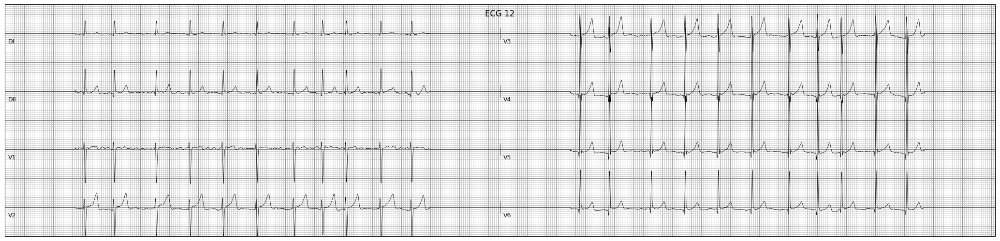

<Figure size 640x480 with 0 Axes>

In [8]:
%run ecg-preprocessing/plot_from_ecg.py codesubset/train/TNMG100046 --new_freq 400 --new_len 4096 --remove_baseline --powerline 60


Next we perform the preprocessing in all exams and convert them into one single h5 file (see [here](https://www.h5py.org/#:~:text=The%20h5py%20package%20is%20a,they%20were%20real%20NumPy%20arrays.) for details about the format). The resulting h5 files contains the traces as arrays with the shape `(number of traces * sequence length * number of leads)` where sequence length is 4096 and number of leads is 8.
The files `train.h5` and `test.h5` will be saved inside the folder `codesubset/`.

In [9]:
# 3. Generate train
if not exists('codesubset/train.h5'):
    !python ecg-preprocessing/generate_h5.py --new_freq 400 --new_len 4096 --remove_baseline --powerline 60 codesubset/train/RECORDS.txt codesubset/train.h5
# 3. Generate test
if not exists('codesubset/test.h5'):
    !python ecg-preprocessing/generate_h5.py --new_freq 400 --new_len 4096 --remove_baseline --powerline 60 codesubset/test/RECORDS.txt codesubset/test.h5

Namespace(input_file='codesubset/train/RECORDS.txt', out_file='codesubset/train.h5', root_dir=None, remove_baseline=True, new_len=4096, new_freq=400.0, scale=1, use_all_leads=False, powerline=60.0, fmt='wfdb')
100% 10000/10000 [01:14<00:00, 134.17it/s]
Namespace(input_file='codesubset/test/RECORDS.txt', out_file='codesubset/test.h5', root_dir=None, remove_baseline=True, new_len=4096, new_freq=400.0, scale=1, use_all_leads=False, powerline=60.0, fmt='wfdb')
100% 6000/6000 [00:44<00:00, 135.81it/s]


### Coding Task 1: Data Analysis

Before starting to model you have to analyse the dataset. You can be creative in your way of *getting a feeling* for the data. What you have to do is:
- plot an ECG after proprocessing saved in the hdf5 file. For this use the `ecg_plot()` example above and see below for how to access the preprocessed data in h5 format.

Some further ideas to explore are:
- check the balance of the data set,
- evaluate the distribution of age and sex of the patients,
- think about the performance that a best naive classifier would achieve, e.g. by random guessing or always predicting one class.

<br />

**How to access the data?**

You can acces the data in the h5 file in the following way
```
import h5py

PATH_TO_H5_FILE = 'codesubset/train.h5'
f = h5py.File(PATH_TO_H5_FILE, 'r')
data = f['tracings']
```
Then, `data[i]` is an numpy array of the $i$th ECG exam (including all time points and leads).


In [10]:
"""
TASK: Insert your code here
"""

import h5py

PATH_TO_H5_FILE_TRAIN = 'codesubset/train.h5'
PATH_TO_H5_FILE_TEST = 'codesubset/test.h5'
f_train = h5py.File(PATH_TO_H5_FILE_TRAIN, 'r')
f_test = h5py.File(PATH_TO_H5_FILE_TEST, 'r')
data = f_train['tracings']

In [11]:
data.shape

(10000, 4096, 8)

In [12]:
data[1].shape

(4096, 8)

<Figure size 640x480 with 0 Axes>

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

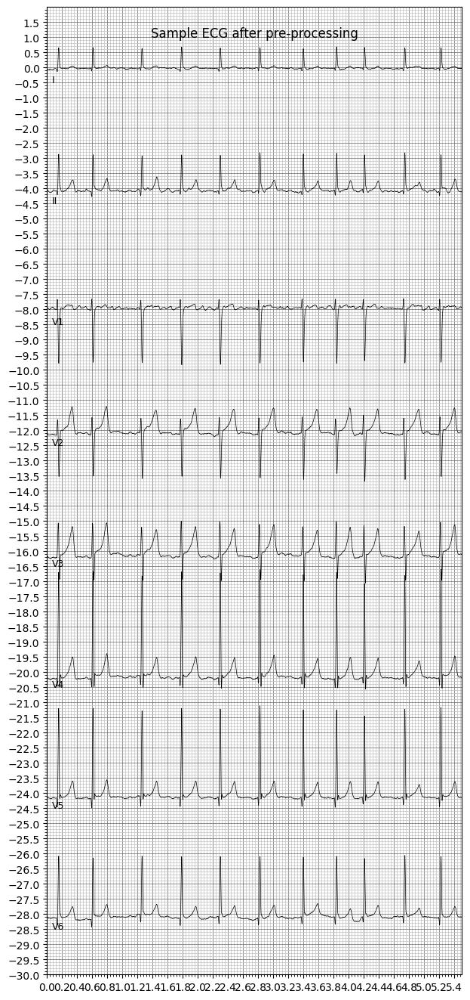

In [13]:
plt.figure()
# lead = ['I', 'II', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
ecg_plot.plot(ecg_sample, sample_rate=sample_rate, style='bw', row_height=8, lead_index=lead, columns=1, title='Sample ECG after pre-processing')
plt.show()

In [14]:
import h5py
import pandas as pd
import numpy as np

path_to_csv_train_labels = 'codesubset/train.csv'
path_to_records = 'codesubset/train/RECORDS.txt'

# load labels and attributes from the CSV file
df = pd.read_csv(path_to_csv_train_labels)

# Get the order of ids in tracings from the RECORDS.txt file
with open(path_to_records, 'r') as r:
    ids_traces = [int(line.strip().split('TNMG')[1]) for line in r]

# Set 'id_exam' as the index and reindex the DataFrame to match the order of tracings
df.set_index('id_exam', inplace=True)
df = df.reindex(ids_traces)

In [15]:
df.columns

Index(['id_patient', 'age', 'sex', 'AF', 'date_exam'], dtype='object')

In [16]:
# Access the labels (for Atrial Fibrillation - AF)
labels = np.array(df['AF'])

# Access age and sex
age = np.array(df['age'])
sex = np.array(df['sex'])

# You can now associate these labels and attributes with the corresponding tracings
# For example, to get the label, age, and sex for the first tracing (index 0):
first_tracing_label = labels[0]
first_tracing_age = age[0]
first_tracing_sex = sex[0]

print(f"Label for first tracing: {first_tracing_label}")
print(f"Age for first tracing: {first_tracing_age}")
print(f"Sex for first tracing: {first_tracing_sex}")

Label for first tracing: 1
Age for first tracing: 72
Sex for first tracing: F


In [17]:
# Distribution of patients in the train dataset
print("Distribution of Atrial Fibrillation (AF):")
print(df['AF'].value_counts())
print("\nPercentage distribution of AF:")
print(df['AF'].value_counts(normalize=True) * 100)

Distribution of Atrial Fibrillation (AF):
AF
0    7000
1    3000
Name: count, dtype: int64

Percentage distribution of AF:
AF
0    70.0
1    30.0
Name: proportion, dtype: float64



Descriptive statistics for Age:
count    10000.000000
mean        57.929600
std         17.921952
min         17.000000
25%         45.000000
50%         60.000000
75%         72.000000
max        103.000000
Name: age, dtype: float64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

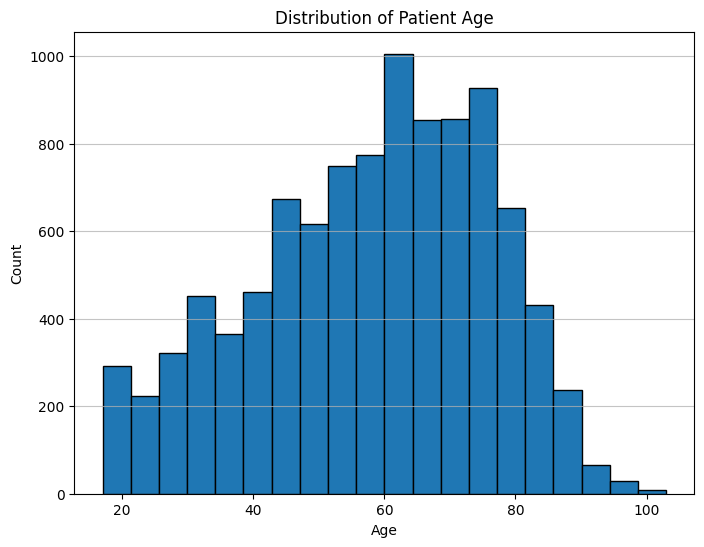

In [18]:
# 2. Examine the distribution of age
print("\nDescriptive statistics for Age:")
print(df['age'].describe())

plt.figure(figsize=(8, 6))
plt.hist(df['age'].dropna(), bins=20, edgecolor='black') # Drop NaN values for plotting
plt.title('Distribution of Patient Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.75)
plt.show()


Distribution of Sex:
sex
F    6307
M    3693
Name: count, dtype: int64

Percentage distribution of Sex:
sex
F    63.07
M    36.93
Name: proportion, dtype: float64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

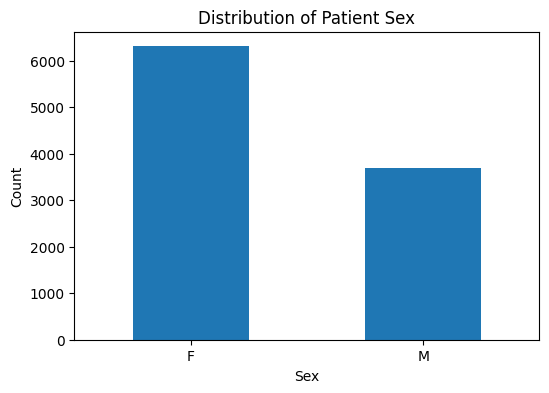

In [19]:
# 3. Examine the distribution of sex
print("\nDistribution of Sex:")
print(df['sex'].value_counts())
print("\nPercentage distribution of Sex:")
print(df['sex'].value_counts(normalize=True) * 100)

plt.figure(figsize=(6, 4))
df['sex'].value_counts().plot(kind='bar')
plt.title('Distribution of Patient Sex')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

### Explanation task 1: Data Analysis

Please explain your main findings of the data analysis task in a few bullet points. Explain also what the preprocessing does and why it is necessary.

<br />


**<font color='red'>Your explanation here:</font>**

The data is not very balanced since 30% of the samples are patients and 70% are healthy people. This is understandable since the scarcity of patient data is common in the field of healthcare. Actually, the absolute number of patient samples in this dataset is not small.

- Age:
  - The age ranges from 17 to 103 yo.
  - The mean age is 57.92 yo, with a standard deviation of 17.92.
  -  50% of are below 60 yo and 75% are below 72 yo.
- Sex: 60% of are female and 40% are male.

The preprocessing is necessary for several reasons:

1. Uniform sample rate makes sure the time intervals across different samples are the same.
2. Some neural netowrk models can only handle sequences with the same length.
2. Removing trends (e.g., baseline wander which is the flat parts of the leads) help preserve only meaningful data for the model to learn.
3. Removing power line noise enhance the data quality and the learning.



---
## Model

The model class consists of two methods:
- `__init__(self, args)`: This methods initializes the class, e.g. by using `mymodel=ModelBaseline(args)`.
- `forward(self,input_data)`: This method is called when we run `model_output=mymodel(input_data)`.

The dimension of the input data is  `(batch size * sequence length * number of leads)`. Where **batch size** is a hyperparameter, **sequence length** is the number of ECG time samples (=4096) and **number of leads** (=8).

The `ModelBaseline` (provided below) is a 2 layer model with one convolutional layers and one linear layer. Some explanations:
- The conv layer downsamples the input traces from 4096 samples to 128 samples and increases the number of channels from 8 (=number of leads) to 32. Here we use a kernel size of 3.
- The linear layer uses the flattened output from the conv and outputs one prediction. Since we have a binary problem, a single prediction is sufficient.


In [20]:
class ModelBaseline(nn.Module):
    def __init__(self,):
        super(ModelBaseline, self).__init__()
        self.kernel_size = 3

        # conv layer
        downsample = self._downsample(4096, 128)
        self.conv1 = nn.Conv1d(in_channels=8,
                               out_channels=32,
                               kernel_size=self.kernel_size,
                               stride=downsample,
                               padding=self._padding(downsample),
                               bias=False)

        # linear layer
        self.lin = nn.Linear(in_features=32*128,
                             out_features=1)

        # ReLU
        self.relu = nn.ReLU()

    def _padding(self, downsample):
        return max(0, int(np.floor((self.kernel_size - downsample + 1) / 2)))

    def _downsample(self, seq_len_in, seq_len_out):
        return int(seq_len_in // seq_len_out)


    def forward(self, x):
        x= x.transpose(2,1)

        x = self.relu(self.conv1(x))
        x_flat= x.view(x.size(0), -1)
        x = self.lin(x_flat)

        return x

### Coding Task 2: Define your model

In the cell below you have to define your model. You can be inspired by the baseline model above but you can also define any other kind of neural network architecture.

In [21]:
class CNNClassifier(nn.Module):
    def __init__(self):
        super(CNNClassifier, self).__init__()
        self.kernel_size = 3

        # Convolutional layers with batch normalization
        self.conv1 = nn.Conv1d(in_channels=8, out_channels=32, kernel_size=self.kernel_size, stride=2, padding=1)
        self.bn1 = nn.BatchNorm1d(32)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=self.kernel_size, stride=2, padding=1)
        self.bn2 = nn.BatchNorm1d(64)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=self.kernel_size, stride=2, padding=1)
        self.bn3 = nn.BatchNorm1d(128)
        self.conv4 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=self.kernel_size, stride=2, padding=1)
        self.bn4 = nn.BatchNorm1d(256)


        # Max pooling layer
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)

        # Dropout layers
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.25)
        self.dropout3 = nn.Dropout(0.5)
        self.dropout4 = nn.Dropout(0.5)


        # Calculate the output size of the convolutional layers to determine the input size for the linear layer
        dummy_input = torch.randn(1, 8, 4096)
        x = self.conv1(dummy_input)
        x = nn.ReLU()(x)
        x = self.bn1(x)
        x = self.pool(x)
        x = self.conv2(x)
        x = nn.ReLU()(x)
        x = self.bn2(x)
        x = self.pool(x)
        x = self.conv3(x)
        x = nn.ReLU()(x)
        x = self.bn3(x)
        x = self.pool(x)
        x = self.conv4(x)
        x = nn.ReLU()(x)
        x = self.bn4(x)
        x = self.pool(x)

        flattened_size = x.view(x.size(0), -1).size(1)


        # Classification layer
        self.fc = nn.Linear(in_features=flattened_size, out_features=1)
        self.relu = nn.ReLU()


    def forward(self, x):
        x = x.transpose(1, 2)

        x = self.relu(self.conv1(x))
        x = self.bn1(x)
        x = self.pool(x)
        x = self.dropout1(x)

        x = self.relu(self.conv2(x))
        x = self.bn2(x)
        x = self.pool(x)
        x = self.dropout2(x)

        x = self.relu(self.conv3(x))
        x = self.bn3(x)
        x = self.pool(x)
        x = self.dropout3(x)

        x = self.relu(self.conv4(x))
        x = self.bn4(x)
        x = self.pool(x)
        x = self.dropout4(x)

        x = x.view(x.size(0), -1)
        output = self.fc(x)

        return output

### Explanation Task 2: Final Model
Please explain and motivate in short sentences or bullet points the choice of your final model.

<br />


**<font color='red'>Your explanation here:</font>**
The reason why I chose this autoencoder model is because it is effective at dealing with time series data such as ECG and EEG. I have used this model before for predicting patients and healthy individuals with other similar biometrics. In the essence, it handles an anomarly detection issue.


---
## Train function

The function `train(...)` is called to in every epoch to train the model. The function loads the training data, makes predictions, compares predictions with true labels in the loss function and adapting the model parameters using stochastic gradient descent.

In the code cell below there is the basic structure to load data from the data loader and to log your loss. The arguments of the function are explained by the use in the `main(...)` function below.

If you are unfamiliar with PyTorch training loops, then this official [tutorial](https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html) might help (especially section "4. Train your Network").

### Coding Task 3: Fill training loop

Fill the code cell below such that the model is training when `train(...)` is called.

In [22]:
def train_loop(epoch, dataloader, model, optimizer, loss_function, device):
    # model to training mode (important to correctly handle dropout or batchnorm layers)
    model.train()
    # allocation
    total_loss = 0  # accumulated loss
    n_entries = 0   # accumulated number of data points
    # progress bar def
    train_pbar = tqdm(dataloader, desc="Training Epoch {epoch:2d}".format(epoch=epoch), leave=True)
    # training loop
    for traces, diagnoses in train_pbar:
        # data to device (CPU or GPU if available)
        traces, diagnoses = traces.to(device), diagnoses.to(device)

        """
        TASK: Insert your code here. This task can be done in 5 lines of code.
        """
        # Forward pass
        outputs = model(traces)
        # Calculate loss
        loss = loss_function(outputs, diagnoses)
        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update accumulated values
        total_loss += loss.detach().cpu().numpy()
        n_entries += len(traces)

        # Update progress bar
        train_pbar.set_postfix({'loss': total_loss / n_entries})
    train_pbar.close()
    return total_loss / n_entries

---
## Eval function

The `eval(...)` function is similar to the `train(...)` function but is used to evaluate the model on validation data without adapting the model parameters. You can prohibit computing gradients by using a `with torch.no_grad():` statement.

Currenlty only the loss is logged here. Additionally you have to collect all your predictions and the true values in order to compute more metrics such as AUROC.

### Coding Task 4: Fill evaluation loop
Fill the code cell below such we obtain model predictions to evaluate the validation loss and collect the predictoin in order to compute other validation metrics in the `main(...)` function.

In [30]:
def eval_loop(epoch, dataloader, model, loss_function, device):
    # model to evaluation mode (important to correctly handle dropout or batchnorm layers)
    model.eval()
    # allocation
    total_loss = 0  # accumulated loss
    n_entries = 0   # accumulated number of data points
    valid_probs = []  # accumulated predicted probabilities
    valid_true = [] # accumulated true labels

    # progress bar def
    eval_pbar = tqdm(dataloader, desc="Evaluation Epoch {epoch:2d}".format(epoch=epoch), leave=True)
    # evaluation loop
    for traces_cpu, diagnoses_cpu in eval_pbar:
        # data to device (CPU or GPU if available)
        traces, diagnoses = traces_cpu.to(device), diagnoses_cpu.to(device)

        """
        TASK: Insert your code here. This task can be done in 6 lines of code.
        """
        with torch.no_grad():
            # Forward pass
            outputs = model(traces)
            # Calculate loss
            loss = loss_function(outputs, diagnoses)

            # Collect predictions and true labels
            valid_probs.append(torch.sigmoid(outputs).detach().cpu().numpy())
            valid_true.append(diagnoses.detach().cpu().numpy())

        # Update accumulated values
        total_loss += loss.detach().cpu().numpy()
        n_entries += len(traces)

        # Update progress bar
        eval_pbar.set_postfix({'loss': total_loss / n_entries})
    eval_pbar.close()
    return total_loss / n_entries, np.vstack(valid_probs), np.vstack(valid_true)

---
## Run Training

In the code cell below there are some initial (non-optimal!) training hyperparameters. Further, we combine everything from above into training code. That means that we build the dataloaders, define the model/loss/optimizer and then train/validate the model over multiple epochs. Here, we save the model with the lowest validation loss as the best model.

### Coding Task 5: Combine everything to train/validate the model

The following tasks are necessary in the code below
- split the data into training and validation data
- define the loss function
- decide and implement validation metric(s) to evaluate and compare the model on

Optional task:
- include learning rate scheduler
- take specific care about possible data inbalance

### Coding Task 6: Run your model and adapt hyperparameters

After you combined everything in task 5, now you run the code to evaluate the model. Based on the resulting validation metrics you tune
- the training hyperparameters
- the model architecture
- the model hyperparameters.

### Explanation Task 3: Hyperparameter
Please explain and motivate in short sentences or bullet points the final choice of hyperparamer and how you developed them.

<br />


**<font color='red'>Your explanation here:</font>**


In [44]:
# set seed
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# choose variables
"""
TASK: Adapt the following hyperparameters if necessary
"""
# learning_rate = 1e-2
# weight_decay = 1e-1
learning_rate = 1e-4
weight_decay = 1e-2
num_epochs = 25
batch_size = 32

In [25]:
from torch.utils.data import TensorDataset, random_split, DataLoader

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
tqdm.write("Use device: {device:}\n".format(device=device))

# =============== Build data loaders ======================================#
tqdm.write("Building data loaders...")

path_to_h5_train, path_to_csv_train, path_to_records = 'codesubset/train.h5', 'codesubset/train.csv', 'codesubset/train/RECORDS.txt'
# load traces
traces = torch.tensor(h5py.File(path_to_h5_train, 'r')['tracings'][()], dtype=torch.float32)
# load labels
ids_traces = [int(x.split('TNMG')[1]) for x in list(pd.read_csv(path_to_records, header=None)[0])] # Get order of ids in traces
df = pd.read_csv(path_to_csv_train)
df.set_index('id_exam', inplace=True)
df = df.reindex(ids_traces) # make sure the order is the same
labels = torch.tensor(np.array(df['AF']), dtype=torch.float32).reshape(-1,1)
# load dataset
dataset = TensorDataset(traces, labels)
len_dataset = len(dataset)
n_classes = len(torch.unique(labels))
# split data
"""
TASK: Split the dataset in train and validation; Insert your code here.
This can be done in <=4 line of code
"""
train_size = int(0.8 * len_dataset)
valid_size = len_dataset - train_size
dataset_train, dataset_valid = random_split(dataset, [train_size, valid_size])

# build data loaders
train_dataloader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False)
tqdm.write("Done!\n")

Use device: cuda

Building data loaders...
Done!



In [34]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score
from torch.utils.data import WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.lr_scheduler import StepLR
# =============== Define model ============================================#
tqdm.write("Define model...")
"""
TASK: Replace the baseline model with your model; Insert your code here
"""
model = CNNClassifier()
model.to(device=device)
tqdm.write("Done!\n")

# =============== Define loss function ====================================#
"""
TASK: define the loss; Insert your code here. This can be done in 1 line of code
"""
# loss_function = nn.BCEWithLogitsLoss()
full_labels_np = np.array([int(dataset[i][1].item()) for i in range(len(dataset))])
class_weights_full = compute_class_weight(class_weight='balanced', classes=np.unique(full_labels_np), y=full_labels_np)
class_weights_full_tensor = torch.tensor(class_weights_full, dtype=torch.float32).to(device)
loss_function = nn.BCEWithLogitsLoss(pos_weight=class_weights_full_tensor[1])

# full_labels = np.array([int(dataset[i][1].item()) for i in range(len(dataset))])
# class_weights_sampler = compute_class_weight(class_weight='balanced', classes=np.unique(full_labels), y=full_labels)
# sample_weights = [class_weights_sampler[label] for label in full_labels]
# sample_weights = torch.tensor(sample_weights, dtype=torch.float32)
# full_dataset_sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

# =============== Define optimizer ========================================#
tqdm.write("Define optimiser...")
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
tqdm.write("Done!\n")

# =============== Define lr scheduler =====================================#
# TODO advanced students (non mandatory)
"""
OPTIONAL: define a learning rate scheduler; Insert your code here
"""
lr_scheduler = StepLR(optimizer, step_size=10, gamma=0.1)

# =============== Train model =============================================#
tqdm.write("Training...")
best_loss = np.Inf
# allocation
train_loss_all, valid_loss_all = [], []
valid_auroc_all, valid_ap_all, valid_f1_all = [], [], [] # Lists to store metrics

# loop over epochs
for epoch in trange(1, num_epochs + 1):
    # training loop
    train_loss = train_loop(epoch, train_dataloader, model, optimizer, loss_function, device)
    # validation loop
    valid_loss, y_pred, y_true = eval_loop(epoch, valid_dataloader, model, loss_function, device)

    # collect losses
    train_loss_all.append(train_loss)
    valid_loss_all.append(valid_loss)

    # compute validation metrics for performance evaluation
    """
    TASK: compute validation metrics (e.g. AUROC); Insert your code here
    This can be done e.g. in 5 lines of code
    """
    # Compute AUROC, AP, and F1
    valid_auroc = roc_auc_score(y_true, y_pred)
    valid_ap = average_precision_score(y_true, y_pred)
    # For F1, we need binary predictions. A common threshold is 0.5 after sigmoid.
    valid_f1 = f1_score(y_true, (y_pred > 0.5).astype(int))

    # Collect metrics
    valid_auroc_all.append(valid_auroc)
    valid_ap_all.append(valid_ap)
    valid_f1_all.append(valid_f1)


    # save best model: here we save the model only for the lowest validation loss
    if valid_loss < best_loss:
        # Save model parameters
        torch.save({'model': model.state_dict()}, 'model.pth')
        # Update best validation loss
        best_loss = valid_loss
        # statement
        model_save_state = "Best model -> saved"
    else:
        model_save_state = ""

    # Print message
    tqdm.write('Epoch {epoch:2d}: \t'
                'Train Loss {train_loss:.6f} \t'
                'Valid Loss {valid_loss:.6f} \t'
                'Valid AUROC {valid_auroc:.4f} \t'
                'Valid AP {valid_ap:.4f} \t'
                'Valid F1 {valid_f1:.4f} \t'
                '{model_save}'
                .format(epoch=epoch,
                        train_loss=train_loss,
                        valid_loss=valid_loss,
                        valid_auroc=valid_auroc,
                        valid_ap=valid_ap,
                        valid_f1=valid_f1,
                        model_save=model_save_state)
                    )

    # Update learning rate with lr-scheduler
    if lr_scheduler:
        lr_scheduler.step()

"""
TASK: Here it can make sense to plot your learning curve; Insert your code here
"""
# Plot the learning curves
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_loss_all, label='Train Loss')
plt.plot(range(1, num_epochs + 1), valid_loss_all, label='Valid Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Curves')
plt.legend()
plt.grid(True)
plt.show()

Define model...
Done!

Define optimiser...
Done!

Training...


  0%|          | 0/30 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.026408 	Valid Loss 0.021101 	Valid AUROC 0.8253 	Valid AP 0.6170 	Valid F1 0.4831 	Best model -> saved


Training Epoch  2:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022087 	Valid Loss 0.018599 	Valid AUROC 0.8593 	Valid AP 0.6898 	Valid F1 0.5844 	Best model -> saved


Training Epoch  3:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.019472 	Valid Loss 0.016773 	Valid AUROC 0.8854 	Valid AP 0.7535 	Valid F1 0.6617 	Best model -> saved


Training Epoch  4:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017749 	Valid Loss 0.017016 	Valid AUROC 0.9038 	Valid AP 0.7876 	Valid F1 0.6472 	


Training Epoch  5:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016789 	Valid Loss 0.017739 	Valid AUROC 0.9167 	Valid AP 0.8085 	Valid F1 0.6200 	


Training Epoch  6:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.015482 	Valid Loss 0.017803 	Valid AUROC 0.9272 	Valid AP 0.8320 	Valid F1 0.6120 	


Training Epoch  7:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.014690 	Valid Loss 0.018559 	Valid AUROC 0.9366 	Valid AP 0.8520 	Valid F1 0.6009 	


Training Epoch  8:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.013555 	Valid Loss 0.016702 	Valid AUROC 0.9465 	Valid AP 0.8735 	Valid F1 0.6602 	Best model -> saved


Training Epoch  9:   0%|          | 0/250 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.012945 	Valid Loss 0.016787 	Valid AUROC 0.9554 	Valid AP 0.8887 	Valid F1 0.6411 	


Training Epoch 10:   0%|          | 0/250 [00:00<?, ?it/s]

KeyboardInterrupt: 


Fold 1/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027575 	Valid Loss 0.016727 	Valid AUROC 0.7839 	Valid AP 0.6081 	Valid F1 0.5458 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.023418 	Valid Loss 0.014120 	Valid AUROC 0.8396 	Valid AP 0.6946 	Valid F1 0.6007 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020641 	Valid Loss 0.012399 	Valid AUROC 0.8842 	Valid AP 0.7690 	Valid F1 0.6365 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.018863 	Valid Loss 0.011580 	Valid AUROC 0.9076 	Valid AP 0.8135 	Valid F1 0.6774 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016944 	Valid Loss 0.010426 	Valid AUROC 0.9347 	Valid AP 0.8617 	Valid F1 0.6978 	Best model for this fold -> saved


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.015379 	Valid Loss 0.009793 	Valid AUROC 0.9507 	Valid AP 0.8906 	Valid F1 0.6955 	Best model for this fold -> saved


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013292 	Valid Loss 0.008609 	Valid AUROC 0.9670 	Valid AP 0.9210 	Valid F1 0.7470 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.011497 	Valid Loss 0.006700 	Valid AUROC 0.9761 	Valid AP 0.9412 	Valid F1 0.8216 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010598 	Valid Loss 0.006953 	Valid AUROC 0.9842 	Valid AP 0.9585 	Valid F1 0.8260 	


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.009297 	Valid Loss 0.005267 	Valid AUROC 0.9872 	Valid AP 0.9671 	Valid F1 0.8797 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008755 	Valid Loss 0.005284 	Valid AUROC 0.9877 	Valid AP 0.9663 	Valid F1 0.8773 	


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008162 	Valid Loss 0.005213 	Valid AUROC 0.9877 	Valid AP 0.9663 	Valid F1 0.8833 	Best model for this fold -> saved


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.008255 	Valid Loss 0.005011 	Valid AUROC 0.9881 	Valid AP 0.9676 	Valid F1 0.8777 	Best model for this fold -> saved


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.007856 	Valid Loss 0.005135 	Valid AUROC 0.9880 	Valid AP 0.9675 	Valid F1 0.8945 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.007747 	Valid Loss 0.004820 	Valid AUROC 0.9886 	Valid AP 0.9678 	Valid F1 0.8952 	Best model for this fold -> saved


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.008272 	Valid Loss 0.004784 	Valid AUROC 0.9894 	Valid AP 0.9703 	Valid F1 0.8897 	Best model for this fold -> saved


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.008010 	Valid Loss 0.005449 	Valid AUROC 0.9890 	Valid AP 0.9702 	Valid F1 0.8796 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.007605 	Valid Loss 0.004688 	Valid AUROC 0.9887 	Valid AP 0.9700 	Valid F1 0.8885 	Best model for this fold -> saved


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.007814 	Valid Loss 0.005265 	Valid AUROC 0.9894 	Valid AP 0.9705 	Valid F1 0.8820 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.008103 	Valid Loss 0.005282 	Valid AUROC 0.9896 	Valid AP 0.9712 	Valid F1 0.8820 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.007783 	Valid Loss 0.004978 	Valid AUROC 0.9901 	Valid AP 0.9713 	Valid F1 0.8941 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.007349 	Valid Loss 0.004800 	Valid AUROC 0.9899 	Valid AP 0.9709 	Valid F1 0.8961 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.007531 	Valid Loss 0.004918 	Valid AUROC 0.9895 	Valid AP 0.9704 	Valid F1 0.8961 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.007329 	Valid Loss 0.004969 	Valid AUROC 0.9902 	Valid AP 0.9720 	Valid F1 0.8937 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.007723 	Valid Loss 0.004793 	Valid AUROC 0.9897 	Valid AP 0.9714 	Valid F1 0.8984 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007557 	Valid Loss 0.004651 	Valid AUROC 0.9902 	Valid AP 0.9722 	Valid F1 0.8964 	Best model for this fold -> saved


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007255 	Valid Loss 0.005090 	Valid AUROC 0.9901 	Valid AP 0.9719 	Valid F1 0.8897 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007501 	Valid Loss 0.004513 	Valid AUROC 0.9897 	Valid AP 0.9721 	Valid F1 0.9014 	Best model for this fold -> saved


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007511 	Valid Loss 0.004798 	Valid AUROC 0.9902 	Valid AP 0.9729 	Valid F1 0.8925 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007429 	Valid Loss 0.005074 	Valid AUROC 0.9903 	Valid AP 0.9720 	Valid F1 0.8897 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007547 	Valid Loss 0.005094 	Valid AUROC 0.9902 	Valid AP 0.9722 	Valid F1 0.8857 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007224 	Valid Loss 0.005056 	Valid AUROC 0.9898 	Valid AP 0.9722 	Valid F1 0.8941 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007633 	Valid Loss 0.004699 	Valid AUROC 0.9903 	Valid AP 0.9721 	Valid F1 0.8980 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007357 	Valid Loss 0.004803 	Valid AUROC 0.9894 	Valid AP 0.9715 	Valid F1 0.9004 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.007608 	Valid Loss 0.005197 	Valid AUROC 0.9903 	Valid AP 0.9722 	Valid F1 0.8893 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007331 	Valid Loss 0.004923 	Valid AUROC 0.9900 	Valid AP 0.9716 	Valid F1 0.8957 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.007274 	Valid Loss 0.005272 	Valid AUROC 0.9900 	Valid AP 0.9714 	Valid F1 0.8836 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.007699 	Valid Loss 0.004293 	Valid AUROC 0.9902 	Valid AP 0.9722 	Valid F1 0.9142 	Best model for this fold -> saved


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007911 	Valid Loss 0.004916 	Valid AUROC 0.9902 	Valid AP 0.9725 	Valid F1 0.8953 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007282 	Valid Loss 0.004610 	Valid AUROC 0.9903 	Valid AP 0.9721 	Valid F1 0.9004 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

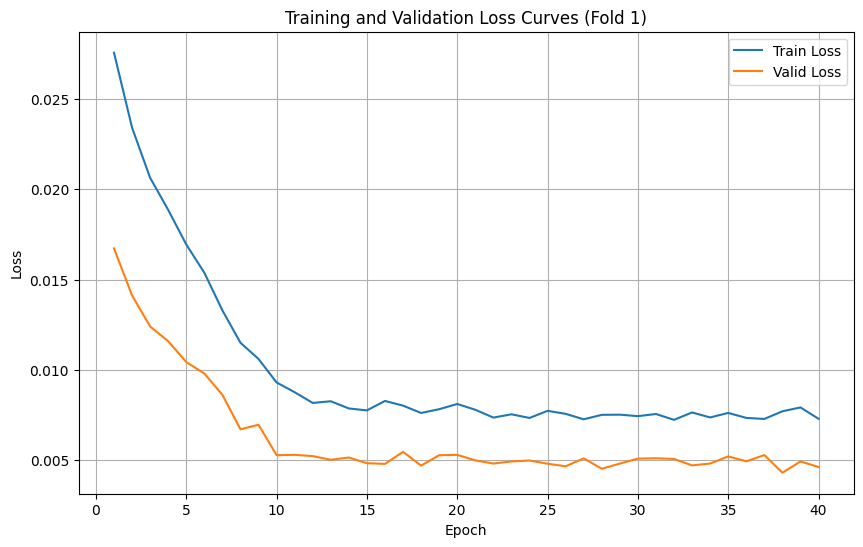

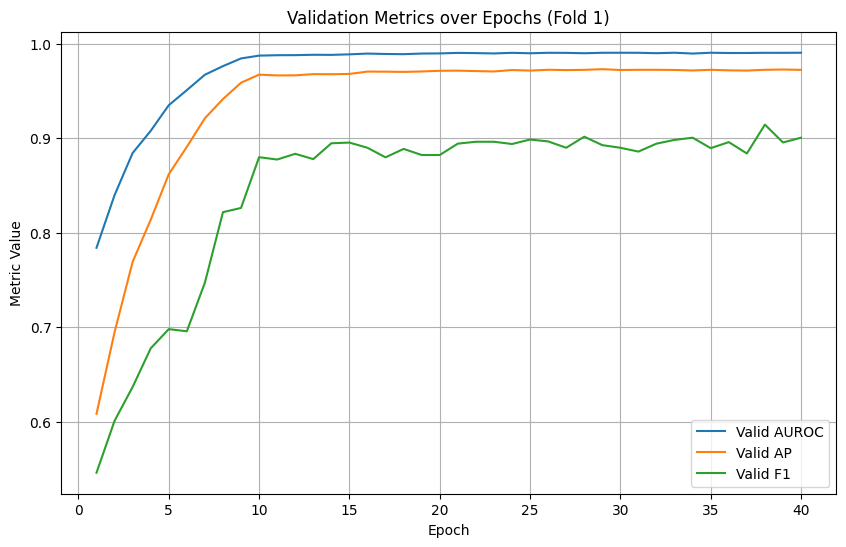


Fold 2/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027717 	Valid Loss 0.016685 	Valid AUROC 0.7936 	Valid AP 0.6009 	Valid F1 0.4529 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022918 	Valid Loss 0.015680 	Valid AUROC 0.8667 	Valid AP 0.7220 	Valid F1 0.3817 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.019789 	Valid Loss 0.018979 	Valid AUROC 0.9092 	Valid AP 0.8155 	Valid F1 0.2873 	


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.018298 	Valid Loss 0.027721 	Valid AUROC 0.9225 	Valid AP 0.8286 	Valid F1 0.1747 	


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016596 	Valid Loss 0.028314 	Valid AUROC 0.9377 	Valid AP 0.8677 	Valid F1 0.1758 	


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.015437 	Valid Loss 0.045858 	Valid AUROC 0.9380 	Valid AP 0.8642 	Valid F1 0.0583 	


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013775 	Valid Loss 0.039263 	Valid AUROC 0.9537 	Valid AP 0.8983 	Valid F1 0.1069 	


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.012938 	Valid Loss 0.030698 	Valid AUROC 0.9631 	Valid AP 0.9159 	Valid F1 0.1867 	


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.012282 	Valid Loss 0.039879 	Valid AUROC 0.9663 	Valid AP 0.9246 	Valid F1 0.1477 	


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.011141 	Valid Loss 0.036527 	Valid AUROC 0.9713 	Valid AP 0.9319 	Valid F1 0.1867 	


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.010917 	Valid Loss 0.040827 	Valid AUROC 0.9681 	Valid AP 0.9223 	Valid F1 0.1702 	


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.010647 	Valid Loss 0.048877 	Valid AUROC 0.9669 	Valid AP 0.9190 	Valid F1 0.1069 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.009905 	Valid Loss 0.038630 	Valid AUROC 0.9685 	Valid AP 0.9219 	Valid F1 0.2030 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.010112 	Valid Loss 0.030722 	Valid AUROC 0.9721 	Valid AP 0.9360 	Valid F1 0.2701 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.009610 	Valid Loss 0.025963 	Valid AUROC 0.9737 	Valid AP 0.9372 	Valid F1 0.3552 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.009435 	Valid Loss 0.027212 	Valid AUROC 0.9735 	Valid AP 0.9404 	Valid F1 0.3324 	


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.009747 	Valid Loss 0.033885 	Valid AUROC 0.9721 	Valid AP 0.9314 	Valid F1 0.2500 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.009330 	Valid Loss 0.027938 	Valid AUROC 0.9743 	Valid AP 0.9391 	Valid F1 0.3231 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.009584 	Valid Loss 0.031396 	Valid AUROC 0.9748 	Valid AP 0.9381 	Valid F1 0.2751 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.009289 	Valid Loss 0.033300 	Valid AUROC 0.9744 	Valid AP 0.9408 	Valid F1 0.2294 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.009373 	Valid Loss 0.029603 	Valid AUROC 0.9747 	Valid AP 0.9414 	Valid F1 0.3184 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.009035 	Valid Loss 0.055623 	Valid AUROC 0.9717 	Valid AP 0.9332 	Valid F1 0.0456 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.008912 	Valid Loss 0.030557 	Valid AUROC 0.9743 	Valid AP 0.9374 	Valid F1 0.2946 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.009572 	Valid Loss 0.027303 	Valid AUROC 0.9744 	Valid AP 0.9391 	Valid F1 0.3507 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.009199 	Valid Loss 0.022507 	Valid AUROC 0.9755 	Valid AP 0.9414 	Valid F1 0.4323 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.009780 	Valid Loss 0.027149 	Valid AUROC 0.9754 	Valid AP 0.9436 	Valid F1 0.3507 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.009768 	Valid Loss 0.029336 	Valid AUROC 0.9751 	Valid AP 0.9449 	Valid F1 0.2994 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.009333 	Valid Loss 0.033159 	Valid AUROC 0.9735 	Valid AP 0.9368 	Valid F1 0.2651 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.009367 	Valid Loss 0.030602 	Valid AUROC 0.9750 	Valid AP 0.9401 	Valid F1 0.2946 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.009516 	Valid Loss 0.040096 	Valid AUROC 0.9729 	Valid AP 0.9320 	Valid F1 0.1646 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.009361 	Valid Loss 0.031050 	Valid AUROC 0.9739 	Valid AP 0.9380 	Valid F1 0.2946 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.009324 	Valid Loss 0.026393 	Valid AUROC 0.9744 	Valid AP 0.9394 	Valid F1 0.3686 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.009033 	Valid Loss 0.030948 	Valid AUROC 0.9747 	Valid AP 0.9393 	Valid F1 0.2946 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.009030 	Valid Loss 0.027923 	Valid AUROC 0.9747 	Valid AP 0.9405 	Valid F1 0.3370 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.009257 	Valid Loss 0.023162 	Valid AUROC 0.9760 	Valid AP 0.9453 	Valid F1 0.4323 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.009411 	Valid Loss 0.032664 	Valid AUROC 0.9734 	Valid AP 0.9355 	Valid F1 0.2651 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.009517 	Valid Loss 0.024437 	Valid AUROC 0.9758 	Valid AP 0.9452 	Valid F1 0.4199 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.009479 	Valid Loss 0.035523 	Valid AUROC 0.9744 	Valid AP 0.9347 	Valid F1 0.2136 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.009047 	Valid Loss 0.027838 	Valid AUROC 0.9743 	Valid AP 0.9373 	Valid F1 0.3462 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.009305 	Valid Loss 0.034991 	Valid AUROC 0.9733 	Valid AP 0.9341 	Valid F1 0.2242 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

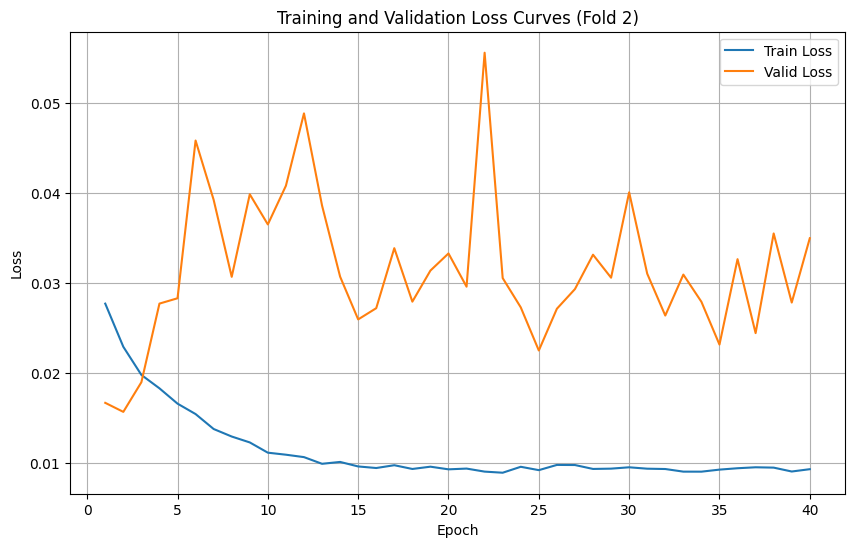

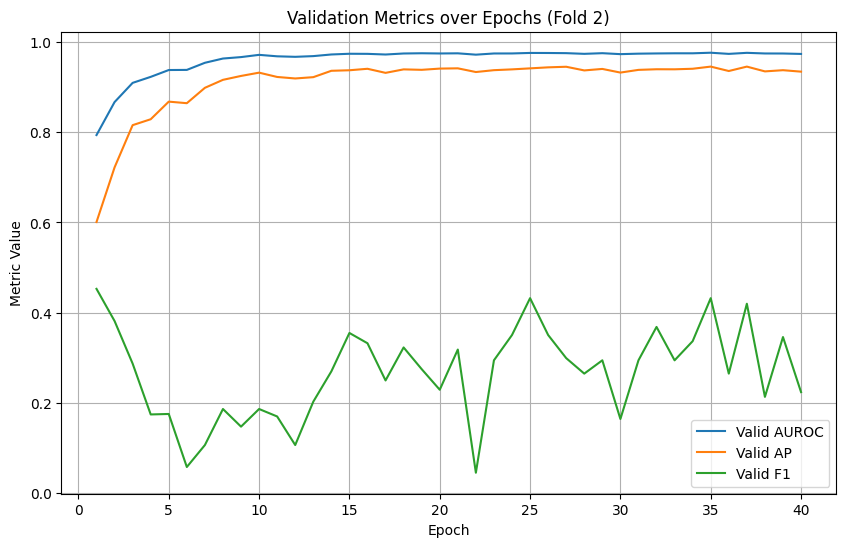


Fold 3/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.028071 	Valid Loss 0.017831 	Valid AUROC 0.8115 	Valid AP 0.6108 	Valid F1 0.6406 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022514 	Valid Loss 0.017498 	Valid AUROC 0.8572 	Valid AP 0.7095 	Valid F1 0.6562 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.019948 	Valid Loss 0.013425 	Valid AUROC 0.8914 	Valid AP 0.7652 	Valid F1 0.7409 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017465 	Valid Loss 0.011880 	Valid AUROC 0.9097 	Valid AP 0.8025 	Valid F1 0.7551 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016207 	Valid Loss 0.010353 	Valid AUROC 0.9298 	Valid AP 0.8442 	Valid F1 0.7805 	Best model for this fold -> saved


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.014560 	Valid Loss 0.008451 	Valid AUROC 0.9522 	Valid AP 0.8915 	Valid F1 0.8342 	Best model for this fold -> saved


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.012231 	Valid Loss 0.007727 	Valid AUROC 0.9603 	Valid AP 0.9177 	Valid F1 0.8383 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.010777 	Valid Loss 0.006544 	Valid AUROC 0.9696 	Valid AP 0.9407 	Valid F1 0.8754 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010218 	Valid Loss 0.006251 	Valid AUROC 0.9762 	Valid AP 0.9550 	Valid F1 0.8834 	Best model for this fold -> saved


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.008650 	Valid Loss 0.005892 	Valid AUROC 0.9805 	Valid AP 0.9618 	Valid F1 0.8897 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008118 	Valid Loss 0.005345 	Valid AUROC 0.9803 	Valid AP 0.9624 	Valid F1 0.9057 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.007923 	Valid Loss 0.005257 	Valid AUROC 0.9812 	Valid AP 0.9641 	Valid F1 0.9085 	Best model for this fold -> saved


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.007684 	Valid Loss 0.005450 	Valid AUROC 0.9804 	Valid AP 0.9633 	Valid F1 0.9100 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.007906 	Valid Loss 0.005112 	Valid AUROC 0.9802 	Valid AP 0.9632 	Valid F1 0.9076 	Best model for this fold -> saved


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.007490 	Valid Loss 0.005273 	Valid AUROC 0.9825 	Valid AP 0.9664 	Valid F1 0.9139 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.007478 	Valid Loss 0.005222 	Valid AUROC 0.9827 	Valid AP 0.9667 	Valid F1 0.9113 	


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.007794 	Valid Loss 0.005027 	Valid AUROC 0.9825 	Valid AP 0.9667 	Valid F1 0.9122 	Best model for this fold -> saved


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.007044 	Valid Loss 0.005597 	Valid AUROC 0.9823 	Valid AP 0.9651 	Valid F1 0.9046 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.007400 	Valid Loss 0.005104 	Valid AUROC 0.9838 	Valid AP 0.9688 	Valid F1 0.9129 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.007411 	Valid Loss 0.005489 	Valid AUROC 0.9826 	Valid AP 0.9661 	Valid F1 0.9081 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.007377 	Valid Loss 0.004971 	Valid AUROC 0.9834 	Valid AP 0.9683 	Valid F1 0.9157 	Best model for this fold -> saved


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.006892 	Valid Loss 0.005213 	Valid AUROC 0.9832 	Valid AP 0.9680 	Valid F1 0.9161 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.007500 	Valid Loss 0.005003 	Valid AUROC 0.9823 	Valid AP 0.9673 	Valid F1 0.9181 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.006994 	Valid Loss 0.005054 	Valid AUROC 0.9838 	Valid AP 0.9690 	Valid F1 0.9170 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.007205 	Valid Loss 0.005013 	Valid AUROC 0.9806 	Valid AP 0.9648 	Valid F1 0.9045 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.006994 	Valid Loss 0.005308 	Valid AUROC 0.9833 	Valid AP 0.9682 	Valid F1 0.9174 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007364 	Valid Loss 0.005008 	Valid AUROC 0.9834 	Valid AP 0.9684 	Valid F1 0.9138 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007088 	Valid Loss 0.004854 	Valid AUROC 0.9838 	Valid AP 0.9691 	Valid F1 0.9197 	Best model for this fold -> saved


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007129 	Valid Loss 0.005034 	Valid AUROC 0.9836 	Valid AP 0.9686 	Valid F1 0.9185 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007154 	Valid Loss 0.005205 	Valid AUROC 0.9829 	Valid AP 0.9674 	Valid F1 0.9161 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007321 	Valid Loss 0.005085 	Valid AUROC 0.9837 	Valid AP 0.9690 	Valid F1 0.9170 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007187 	Valid Loss 0.004894 	Valid AUROC 0.9833 	Valid AP 0.9685 	Valid F1 0.9141 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007058 	Valid Loss 0.005049 	Valid AUROC 0.9841 	Valid AP 0.9695 	Valid F1 0.9183 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007192 	Valid Loss 0.005121 	Valid AUROC 0.9838 	Valid AP 0.9691 	Valid F1 0.9148 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.006874 	Valid Loss 0.005593 	Valid AUROC 0.9828 	Valid AP 0.9662 	Valid F1 0.9000 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.006828 	Valid Loss 0.005008 	Valid AUROC 0.9831 	Valid AP 0.9679 	Valid F1 0.9172 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.006690 	Valid Loss 0.005101 	Valid AUROC 0.9841 	Valid AP 0.9693 	Valid F1 0.9177 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.007123 	Valid Loss 0.005271 	Valid AUROC 0.9826 	Valid AP 0.9669 	Valid F1 0.9101 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007065 	Valid Loss 0.005394 	Valid AUROC 0.9805 	Valid AP 0.9618 	Valid F1 0.9196 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007154 	Valid Loss 0.004898 	Valid AUROC 0.9830 	Valid AP 0.9677 	Valid F1 0.9113 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

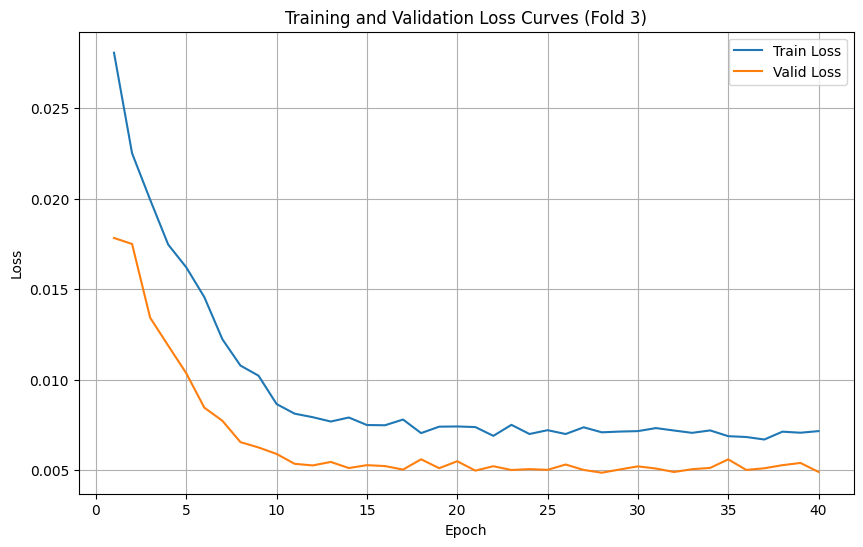

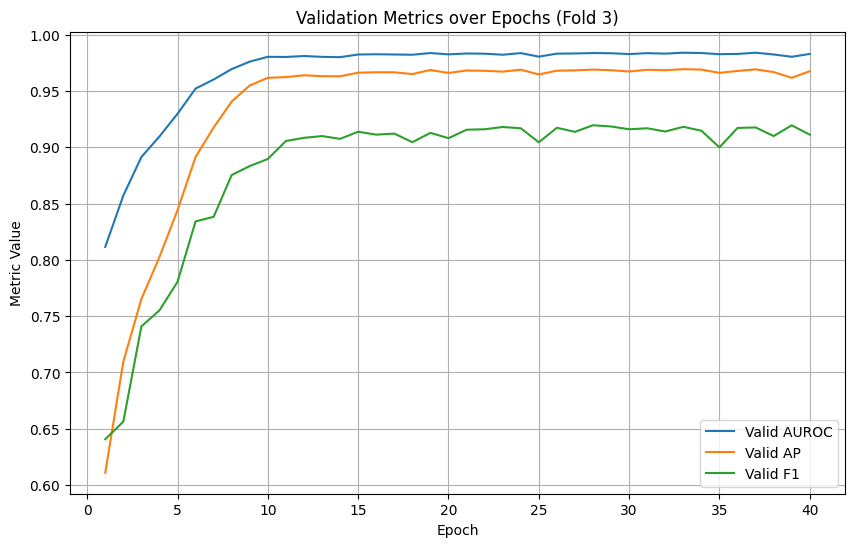


Fold 4/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027832 	Valid Loss 0.017847 	Valid AUROC 0.7790 	Valid AP 0.5594 	Valid F1 0.2723 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022420 	Valid Loss 0.016261 	Valid AUROC 0.8367 	Valid AP 0.6605 	Valid F1 0.4331 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020129 	Valid Loss 0.015137 	Valid AUROC 0.8891 	Valid AP 0.7674 	Valid F1 0.4917 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017374 	Valid Loss 0.014385 	Valid AUROC 0.9210 	Valid AP 0.8327 	Valid F1 0.5315 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.015037 	Valid Loss 0.014558 	Valid AUROC 0.9409 	Valid AP 0.8717 	Valid F1 0.5568 	


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.013386 	Valid Loss 0.012523 	Valid AUROC 0.9514 	Valid AP 0.8940 	Valid F1 0.6595 	Best model for this fold -> saved


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.011906 	Valid Loss 0.011325 	Valid AUROC 0.9599 	Valid AP 0.9132 	Valid F1 0.7149 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.010812 	Valid Loss 0.010051 	Valid AUROC 0.9613 	Valid AP 0.9216 	Valid F1 0.7674 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.009813 	Valid Loss 0.010795 	Valid AUROC 0.9649 	Valid AP 0.9283 	Valid F1 0.7556 	


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.009202 	Valid Loss 0.010984 	Valid AUROC 0.9684 	Valid AP 0.9339 	Valid F1 0.7480 	


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008165 	Valid Loss 0.010679 	Valid AUROC 0.9697 	Valid AP 0.9364 	Valid F1 0.7480 	


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008435 	Valid Loss 0.009991 	Valid AUROC 0.9695 	Valid AP 0.9360 	Valid F1 0.7530 	Best model for this fold -> saved


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.007967 	Valid Loss 0.010534 	Valid AUROC 0.9689 	Valid AP 0.9363 	Valid F1 0.7454 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.008238 	Valid Loss 0.009210 	Valid AUROC 0.9693 	Valid AP 0.9333 	Valid F1 0.7882 	Best model for this fold -> saved


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.007976 	Valid Loss 0.010106 	Valid AUROC 0.9708 	Valid AP 0.9384 	Valid F1 0.7581 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.007806 	Valid Loss 0.009221 	Valid AUROC 0.9711 	Valid AP 0.9394 	Valid F1 0.8039 	


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.007980 	Valid Loss 0.009070 	Valid AUROC 0.9712 	Valid AP 0.9390 	Valid F1 0.8161 	Best model for this fold -> saved


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.008131 	Valid Loss 0.009652 	Valid AUROC 0.9730 	Valid AP 0.9404 	Valid F1 0.7802 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.007575 	Valid Loss 0.009123 	Valid AUROC 0.9725 	Valid AP 0.9402 	Valid F1 0.7992 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.007559 	Valid Loss 0.011459 	Valid AUROC 0.9715 	Valid AP 0.9395 	Valid F1 0.7366 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.007369 	Valid Loss 0.009452 	Valid AUROC 0.9742 	Valid AP 0.9425 	Valid F1 0.8023 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.007769 	Valid Loss 0.009643 	Valid AUROC 0.9725 	Valid AP 0.9415 	Valid F1 0.7793 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.007577 	Valid Loss 0.010597 	Valid AUROC 0.9722 	Valid AP 0.9391 	Valid F1 0.7621 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.007454 	Valid Loss 0.008728 	Valid AUROC 0.9744 	Valid AP 0.9447 	Valid F1 0.8192 	Best model for this fold -> saved


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.007682 	Valid Loss 0.011418 	Valid AUROC 0.9728 	Valid AP 0.9391 	Valid F1 0.7318 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007728 	Valid Loss 0.010189 	Valid AUROC 0.9729 	Valid AP 0.9402 	Valid F1 0.7596 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007379 	Valid Loss 0.009178 	Valid AUROC 0.9740 	Valid AP 0.9437 	Valid F1 0.8101 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007608 	Valid Loss 0.009661 	Valid AUROC 0.9731 	Valid AP 0.9418 	Valid F1 0.7890 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007752 	Valid Loss 0.010270 	Valid AUROC 0.9730 	Valid AP 0.9424 	Valid F1 0.7735 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007434 	Valid Loss 0.009576 	Valid AUROC 0.9737 	Valid AP 0.9424 	Valid F1 0.7866 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007553 	Valid Loss 0.010822 	Valid AUROC 0.9725 	Valid AP 0.9403 	Valid F1 0.7571 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007653 	Valid Loss 0.011225 	Valid AUROC 0.9720 	Valid AP 0.9391 	Valid F1 0.7505 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007600 	Valid Loss 0.010204 	Valid AUROC 0.9724 	Valid AP 0.9399 	Valid F1 0.7729 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007697 	Valid Loss 0.008189 	Valid AUROC 0.9740 	Valid AP 0.9424 	Valid F1 0.8340 	Best model for this fold -> saved


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.007817 	Valid Loss 0.009013 	Valid AUROC 0.9736 	Valid AP 0.9407 	Valid F1 0.8069 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007579 	Valid Loss 0.009053 	Valid AUROC 0.9735 	Valid AP 0.9421 	Valid F1 0.8154 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.007358 	Valid Loss 0.011757 	Valid AUROC 0.9720 	Valid AP 0.9395 	Valid F1 0.7366 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.007504 	Valid Loss 0.009116 	Valid AUROC 0.9741 	Valid AP 0.9433 	Valid F1 0.8124 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007882 	Valid Loss 0.009640 	Valid AUROC 0.9736 	Valid AP 0.9422 	Valid F1 0.7866 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007834 	Valid Loss 0.009074 	Valid AUROC 0.9739 	Valid AP 0.9426 	Valid F1 0.8154 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

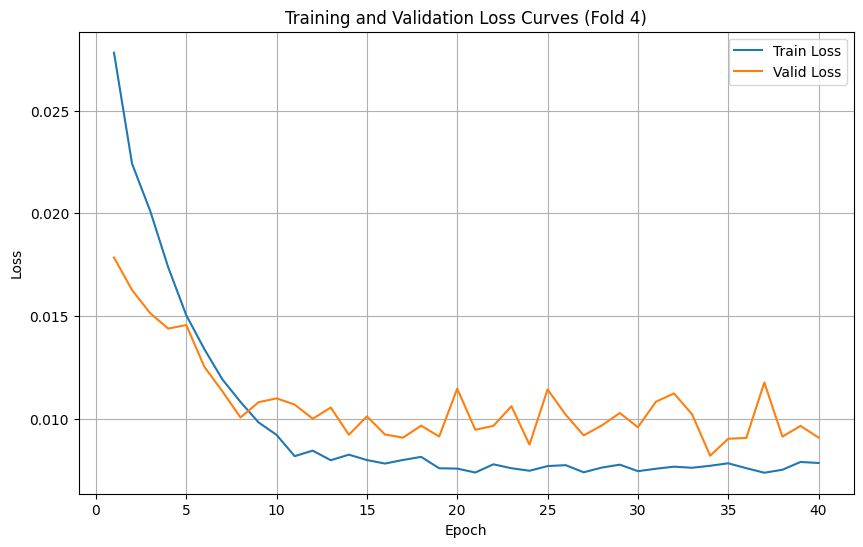

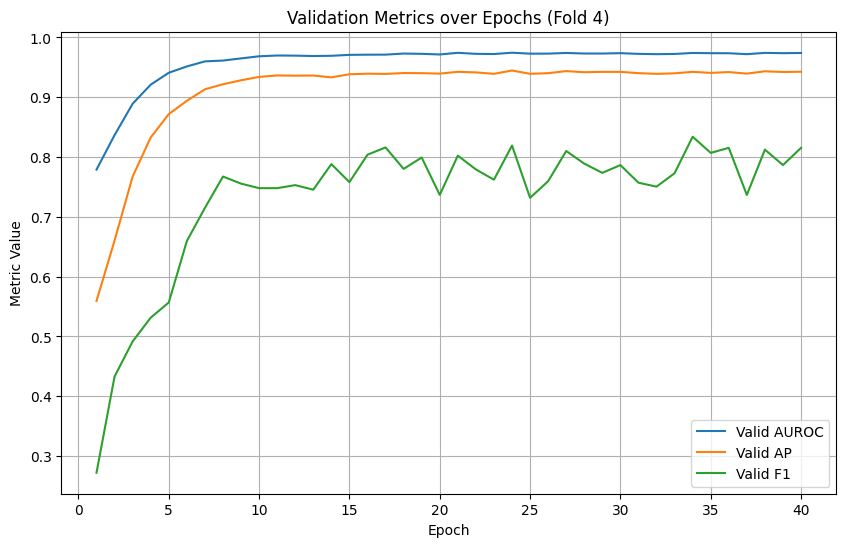


Fold 5/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.026764 	Valid Loss 0.014898 	Valid AUROC 0.8336 	Valid AP 0.7033 	Valid F1 0.5833 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022191 	Valid Loss 0.012562 	Valid AUROC 0.8795 	Valid AP 0.7762 	Valid F1 0.6765 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020602 	Valid Loss 0.011431 	Valid AUROC 0.8997 	Valid AP 0.8104 	Valid F1 0.6902 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.018341 	Valid Loss 0.010522 	Valid AUROC 0.9204 	Valid AP 0.8325 	Valid F1 0.7121 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016700 	Valid Loss 0.009439 	Valid AUROC 0.9344 	Valid AP 0.8624 	Valid F1 0.7631 	Best model for this fold -> saved


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.015110 	Valid Loss 0.008120 	Valid AUROC 0.9534 	Valid AP 0.8981 	Valid F1 0.8223 	Best model for this fold -> saved


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.012566 	Valid Loss 0.007190 	Valid AUROC 0.9643 	Valid AP 0.9175 	Valid F1 0.8327 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.010869 	Valid Loss 0.006296 	Valid AUROC 0.9772 	Valid AP 0.9444 	Valid F1 0.8530 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.009794 	Valid Loss 0.005222 	Valid AUROC 0.9829 	Valid AP 0.9579 	Valid F1 0.8865 	Best model for this fold -> saved


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.008613 	Valid Loss 0.004973 	Valid AUROC 0.9878 	Valid AP 0.9673 	Valid F1 0.8889 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.007939 	Valid Loss 0.004663 	Valid AUROC 0.9868 	Valid AP 0.9639 	Valid F1 0.9018 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008454 	Valid Loss 0.004690 	Valid AUROC 0.9861 	Valid AP 0.9646 	Valid F1 0.9011 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.007986 	Valid Loss 0.004649 	Valid AUROC 0.9875 	Valid AP 0.9664 	Valid F1 0.9049 	Best model for this fold -> saved


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.007359 	Valid Loss 0.005068 	Valid AUROC 0.9883 	Valid AP 0.9664 	Valid F1 0.8849 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.007953 	Valid Loss 0.004368 	Valid AUROC 0.9879 	Valid AP 0.9683 	Valid F1 0.9107 	Best model for this fold -> saved


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.007799 	Valid Loss 0.004211 	Valid AUROC 0.9872 	Valid AP 0.9656 	Valid F1 0.9144 	Best model for this fold -> saved


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.007819 	Valid Loss 0.004461 	Valid AUROC 0.9879 	Valid AP 0.9660 	Valid F1 0.9049 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.007308 	Valid Loss 0.004201 	Valid AUROC 0.9877 	Valid AP 0.9665 	Valid F1 0.9119 	Best model for this fold -> saved


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.007378 	Valid Loss 0.004148 	Valid AUROC 0.9890 	Valid AP 0.9687 	Valid F1 0.9091 	Best model for this fold -> saved


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.007289 	Valid Loss 0.004140 	Valid AUROC 0.9874 	Valid AP 0.9667 	Valid F1 0.9165 	Best model for this fold -> saved


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.007526 	Valid Loss 0.004166 	Valid AUROC 0.9885 	Valid AP 0.9691 	Valid F1 0.9148 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.007185 	Valid Loss 0.004180 	Valid AUROC 0.9883 	Valid AP 0.9688 	Valid F1 0.9062 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.007577 	Valid Loss 0.004162 	Valid AUROC 0.9891 	Valid AP 0.9714 	Valid F1 0.9091 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.007576 	Valid Loss 0.004070 	Valid AUROC 0.9889 	Valid AP 0.9702 	Valid F1 0.9185 	Best model for this fold -> saved


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.007387 	Valid Loss 0.004248 	Valid AUROC 0.9888 	Valid AP 0.9693 	Valid F1 0.9091 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007172 	Valid Loss 0.004309 	Valid AUROC 0.9892 	Valid AP 0.9706 	Valid F1 0.9049 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007285 	Valid Loss 0.004443 	Valid AUROC 0.9894 	Valid AP 0.9717 	Valid F1 0.9049 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007202 	Valid Loss 0.004549 	Valid AUROC 0.9896 	Valid AP 0.9715 	Valid F1 0.9030 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007290 	Valid Loss 0.004039 	Valid AUROC 0.9885 	Valid AP 0.9689 	Valid F1 0.9160 	Best model for this fold -> saved


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007433 	Valid Loss 0.004089 	Valid AUROC 0.9891 	Valid AP 0.9704 	Valid F1 0.9129 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007231 	Valid Loss 0.004155 	Valid AUROC 0.9888 	Valid AP 0.9683 	Valid F1 0.9129 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007560 	Valid Loss 0.004241 	Valid AUROC 0.9889 	Valid AP 0.9697 	Valid F1 0.9014 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007361 	Valid Loss 0.004114 	Valid AUROC 0.9892 	Valid AP 0.9699 	Valid F1 0.9129 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007488 	Valid Loss 0.004086 	Valid AUROC 0.9893 	Valid AP 0.9704 	Valid F1 0.9072 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.007397 	Valid Loss 0.004082 	Valid AUROC 0.9890 	Valid AP 0.9697 	Valid F1 0.9110 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007149 	Valid Loss 0.003987 	Valid AUROC 0.9891 	Valid AP 0.9709 	Valid F1 0.9167 	Best model for this fold -> saved


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.007094 	Valid Loss 0.004070 	Valid AUROC 0.9879 	Valid AP 0.9659 	Valid F1 0.9215 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.007575 	Valid Loss 0.004086 	Valid AUROC 0.9881 	Valid AP 0.9673 	Valid F1 0.9218 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007216 	Valid Loss 0.004497 	Valid AUROC 0.9898 	Valid AP 0.9711 	Valid F1 0.9011 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.008080 	Valid Loss 0.004220 	Valid AUROC 0.9886 	Valid AP 0.9695 	Valid F1 0.9110 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

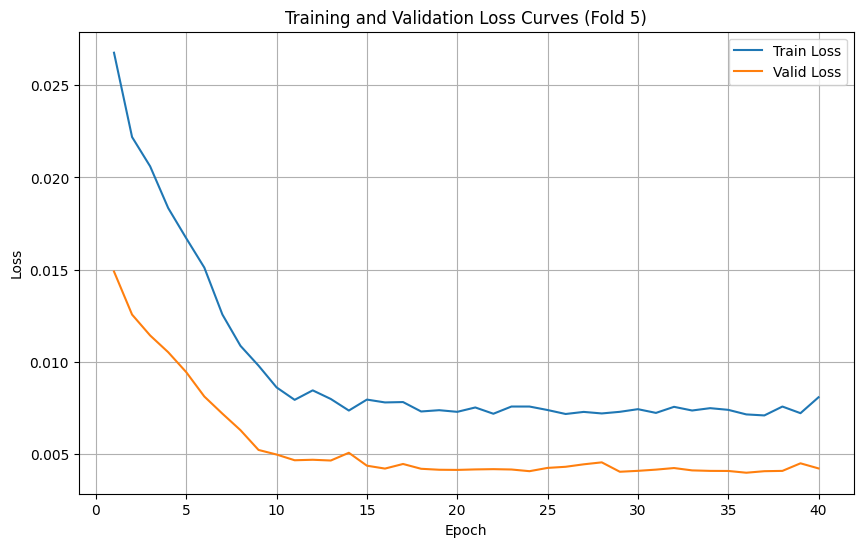

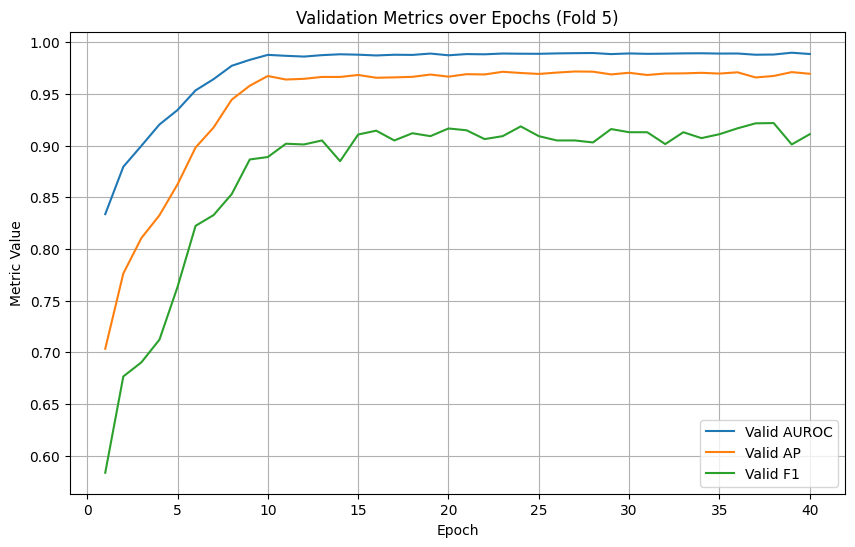


Fold 6/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027123 	Valid Loss 0.015712 	Valid AUROC 0.8184 	Valid AP 0.6213 	Valid F1 0.5736 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022197 	Valid Loss 0.013314 	Valid AUROC 0.8629 	Valid AP 0.7219 	Valid F1 0.6393 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.019780 	Valid Loss 0.012383 	Valid AUROC 0.8942 	Valid AP 0.7706 	Valid F1 0.6250 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017234 	Valid Loss 0.011533 	Valid AUROC 0.9145 	Valid AP 0.8001 	Valid F1 0.6602 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.015924 	Valid Loss 0.011040 	Valid AUROC 0.9284 	Valid AP 0.8385 	Valid F1 0.6798 	Best model for this fold -> saved


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.014283 	Valid Loss 0.011606 	Valid AUROC 0.9409 	Valid AP 0.8552 	Valid F1 0.6472 	


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013483 	Valid Loss 0.010171 	Valid AUROC 0.9524 	Valid AP 0.8904 	Valid F1 0.7054 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.012015 	Valid Loss 0.008864 	Valid AUROC 0.9645 	Valid AP 0.9120 	Valid F1 0.7621 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010916 	Valid Loss 0.009231 	Valid AUROC 0.9716 	Valid AP 0.9211 	Valid F1 0.7490 	


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.009464 	Valid Loss 0.006639 	Valid AUROC 0.9781 	Valid AP 0.9411 	Valid F1 0.8541 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008756 	Valid Loss 0.006831 	Valid AUROC 0.9787 	Valid AP 0.9427 	Valid F1 0.8494 	


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008364 	Valid Loss 0.006406 	Valid AUROC 0.9782 	Valid AP 0.9423 	Valid F1 0.8708 	Best model for this fold -> saved


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.008662 	Valid Loss 0.006556 	Valid AUROC 0.9795 	Valid AP 0.9461 	Valid F1 0.8556 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.008596 	Valid Loss 0.006432 	Valid AUROC 0.9794 	Valid AP 0.9458 	Valid F1 0.8618 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.008008 	Valid Loss 0.006640 	Valid AUROC 0.9798 	Valid AP 0.9461 	Valid F1 0.8494 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.007943 	Valid Loss 0.006131 	Valid AUROC 0.9795 	Valid AP 0.9445 	Valid F1 0.8772 	Best model for this fold -> saved


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.008081 	Valid Loss 0.006378 	Valid AUROC 0.9809 	Valid AP 0.9485 	Valid F1 0.8613 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.008084 	Valid Loss 0.005932 	Valid AUROC 0.9806 	Valid AP 0.9486 	Valid F1 0.8862 	Best model for this fold -> saved


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.008574 	Valid Loss 0.005786 	Valid AUROC 0.9814 	Valid AP 0.9499 	Valid F1 0.8862 	Best model for this fold -> saved


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.008060 	Valid Loss 0.005872 	Valid AUROC 0.9789 	Valid AP 0.9451 	Valid F1 0.8904 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.008036 	Valid Loss 0.005642 	Valid AUROC 0.9810 	Valid AP 0.9510 	Valid F1 0.8981 	Best model for this fold -> saved


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.007663 	Valid Loss 0.005494 	Valid AUROC 0.9808 	Valid AP 0.9493 	Valid F1 0.9026 	Best model for this fold -> saved


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.008043 	Valid Loss 0.005701 	Valid AUROC 0.9801 	Valid AP 0.9468 	Valid F1 0.8966 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.008137 	Valid Loss 0.006028 	Valid AUROC 0.9822 	Valid AP 0.9522 	Valid F1 0.8730 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.008106 	Valid Loss 0.005729 	Valid AUROC 0.9810 	Valid AP 0.9507 	Valid F1 0.8927 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007949 	Valid Loss 0.005651 	Valid AUROC 0.9796 	Valid AP 0.9454 	Valid F1 0.9007 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007757 	Valid Loss 0.006320 	Valid AUROC 0.9809 	Valid AP 0.9472 	Valid F1 0.8719 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.008019 	Valid Loss 0.006028 	Valid AUROC 0.9817 	Valid AP 0.9519 	Valid F1 0.8739 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007834 	Valid Loss 0.005814 	Valid AUROC 0.9809 	Valid AP 0.9477 	Valid F1 0.8870 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007547 	Valid Loss 0.005861 	Valid AUROC 0.9813 	Valid AP 0.9502 	Valid F1 0.8904 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007909 	Valid Loss 0.005788 	Valid AUROC 0.9821 	Valid AP 0.9531 	Valid F1 0.8842 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007858 	Valid Loss 0.005761 	Valid AUROC 0.9817 	Valid AP 0.9520 	Valid F1 0.8885 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007588 	Valid Loss 0.006216 	Valid AUROC 0.9810 	Valid AP 0.9489 	Valid F1 0.8730 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007797 	Valid Loss 0.005848 	Valid AUROC 0.9768 	Valid AP 0.9395 	Valid F1 0.8923 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.007749 	Valid Loss 0.006064 	Valid AUROC 0.9812 	Valid AP 0.9502 	Valid F1 0.8750 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007593 	Valid Loss 0.006361 	Valid AUROC 0.9819 	Valid AP 0.9512 	Valid F1 0.8608 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.007686 	Valid Loss 0.005858 	Valid AUROC 0.9807 	Valid AP 0.9488 	Valid F1 0.8831 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.008018 	Valid Loss 0.005766 	Valid AUROC 0.9806 	Valid AP 0.9478 	Valid F1 0.8943 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007993 	Valid Loss 0.005947 	Valid AUROC 0.9820 	Valid AP 0.9530 	Valid F1 0.8834 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007765 	Valid Loss 0.005808 	Valid AUROC 0.9814 	Valid AP 0.9512 	Valid F1 0.8920 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

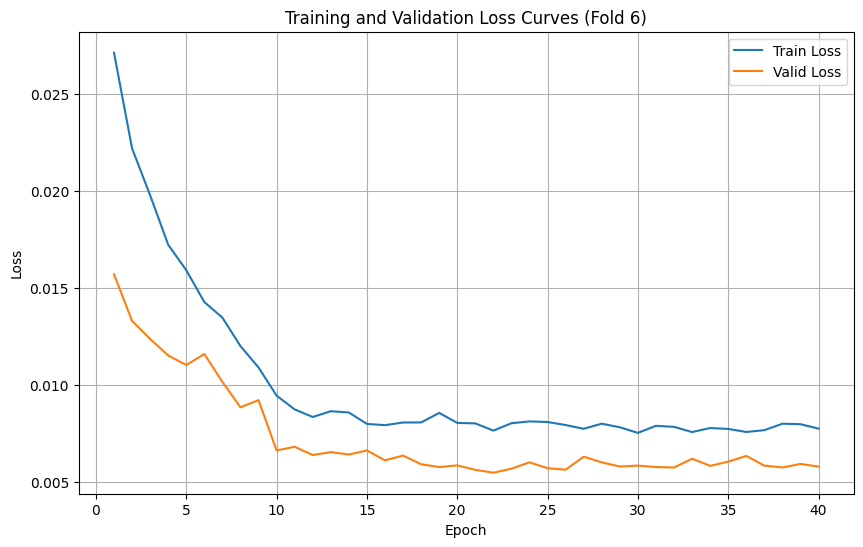

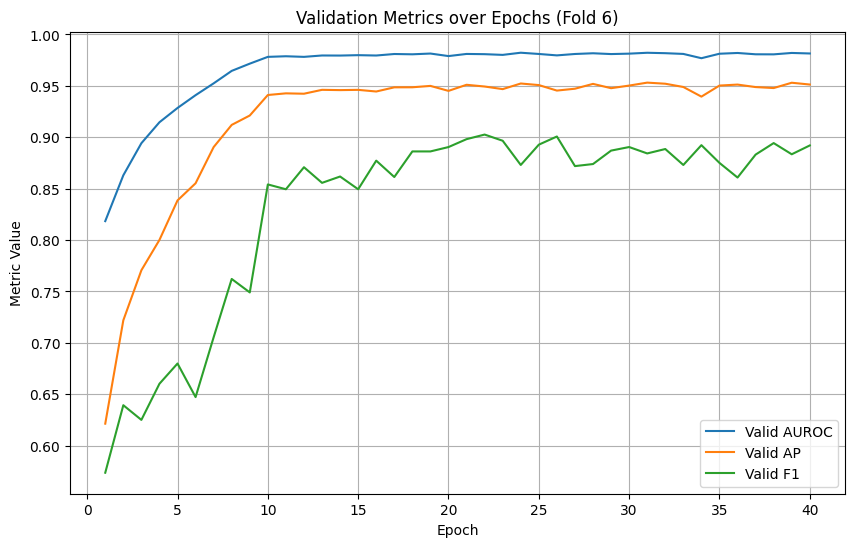


Fold 7/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027826 	Valid Loss 0.016174 	Valid AUROC 0.8245 	Valid AP 0.6568 	Valid F1 0.4522 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.023341 	Valid Loss 0.012989 	Valid AUROC 0.8771 	Valid AP 0.7648 	Valid F1 0.6416 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020869 	Valid Loss 0.011631 	Valid AUROC 0.9110 	Valid AP 0.8180 	Valid F1 0.6473 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.018847 	Valid Loss 0.010850 	Valid AUROC 0.9188 	Valid AP 0.8425 	Valid F1 0.6815 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016874 	Valid Loss 0.011064 	Valid AUROC 0.9366 	Valid AP 0.8745 	Valid F1 0.6523 	


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.015686 	Valid Loss 0.010364 	Valid AUROC 0.9480 	Valid AP 0.8922 	Valid F1 0.6567 	Best model for this fold -> saved


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013916 	Valid Loss 0.010193 	Valid AUROC 0.9641 	Valid AP 0.9188 	Valid F1 0.6724 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.011960 	Valid Loss 0.008354 	Valid AUROC 0.9716 	Valid AP 0.9348 	Valid F1 0.7510 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010580 	Valid Loss 0.007780 	Valid AUROC 0.9788 	Valid AP 0.9490 	Valid F1 0.7850 	Best model for this fold -> saved


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.009277 	Valid Loss 0.006660 	Valid AUROC 0.9849 	Valid AP 0.9624 	Valid F1 0.8168 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008837 	Valid Loss 0.006265 	Valid AUROC 0.9855 	Valid AP 0.9639 	Valid F1 0.8355 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008408 	Valid Loss 0.006372 	Valid AUROC 0.9851 	Valid AP 0.9628 	Valid F1 0.8355 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.008538 	Valid Loss 0.006342 	Valid AUROC 0.9859 	Valid AP 0.9644 	Valid F1 0.8377 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.008146 	Valid Loss 0.006233 	Valid AUROC 0.9855 	Valid AP 0.9629 	Valid F1 0.8383 	Best model for this fold -> saved


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.008241 	Valid Loss 0.006212 	Valid AUROC 0.9862 	Valid AP 0.9651 	Valid F1 0.8377 	Best model for this fold -> saved


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.008163 	Valid Loss 0.005175 	Valid AUROC 0.9866 	Valid AP 0.9662 	Valid F1 0.8680 	Best model for this fold -> saved


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.008011 	Valid Loss 0.006296 	Valid AUROC 0.9870 	Valid AP 0.9671 	Valid F1 0.8327 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.007714 	Valid Loss 0.005595 	Valid AUROC 0.9875 	Valid AP 0.9681 	Valid F1 0.8561 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.008092 	Valid Loss 0.005576 	Valid AUROC 0.9873 	Valid AP 0.9675 	Valid F1 0.8566 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.007374 	Valid Loss 0.007013 	Valid AUROC 0.9870 	Valid AP 0.9668 	Valid F1 0.7913 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.007669 	Valid Loss 0.004890 	Valid AUROC 0.9882 	Valid AP 0.9699 	Valid F1 0.8781 	Best model for this fold -> saved


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.007761 	Valid Loss 0.005153 	Valid AUROC 0.9884 	Valid AP 0.9705 	Valid F1 0.8748 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.008026 	Valid Loss 0.005676 	Valid AUROC 0.9878 	Valid AP 0.9686 	Valid F1 0.8534 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.007665 	Valid Loss 0.005572 	Valid AUROC 0.9879 	Valid AP 0.9689 	Valid F1 0.8513 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.007972 	Valid Loss 0.005185 	Valid AUROC 0.9885 	Valid AP 0.9709 	Valid F1 0.8665 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007938 	Valid Loss 0.005014 	Valid AUROC 0.9885 	Valid AP 0.9708 	Valid F1 0.8696 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.007375 	Valid Loss 0.005773 	Valid AUROC 0.9881 	Valid AP 0.9695 	Valid F1 0.8421 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007731 	Valid Loss 0.005371 	Valid AUROC 0.9885 	Valid AP 0.9707 	Valid F1 0.8577 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.007369 	Valid Loss 0.005995 	Valid AUROC 0.9884 	Valid AP 0.9703 	Valid F1 0.8355 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.007712 	Valid Loss 0.005264 	Valid AUROC 0.9883 	Valid AP 0.9703 	Valid F1 0.8608 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.007600 	Valid Loss 0.005364 	Valid AUROC 0.9877 	Valid AP 0.9685 	Valid F1 0.8566 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007332 	Valid Loss 0.005312 	Valid AUROC 0.9887 	Valid AP 0.9714 	Valid F1 0.8598 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.007383 	Valid Loss 0.005213 	Valid AUROC 0.9886 	Valid AP 0.9710 	Valid F1 0.8681 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.007703 	Valid Loss 0.005262 	Valid AUROC 0.9884 	Valid AP 0.9706 	Valid F1 0.8645 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.007549 	Valid Loss 0.005141 	Valid AUROC 0.9885 	Valid AP 0.9705 	Valid F1 0.8702 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007775 	Valid Loss 0.005983 	Valid AUROC 0.9875 	Valid AP 0.9679 	Valid F1 0.8383 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.007791 	Valid Loss 0.005537 	Valid AUROC 0.9886 	Valid AP 0.9705 	Valid F1 0.8513 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.007854 	Valid Loss 0.004925 	Valid AUROC 0.9886 	Valid AP 0.9709 	Valid F1 0.8873 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.007595 	Valid Loss 0.005134 	Valid AUROC 0.9885 	Valid AP 0.9707 	Valid F1 0.8686 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007331 	Valid Loss 0.005314 	Valid AUROC 0.9886 	Valid AP 0.9708 	Valid F1 0.8619 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

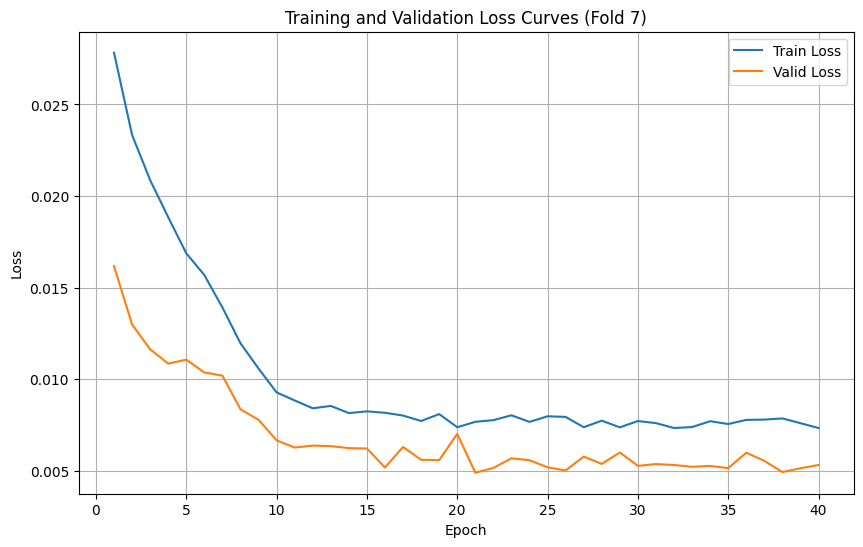

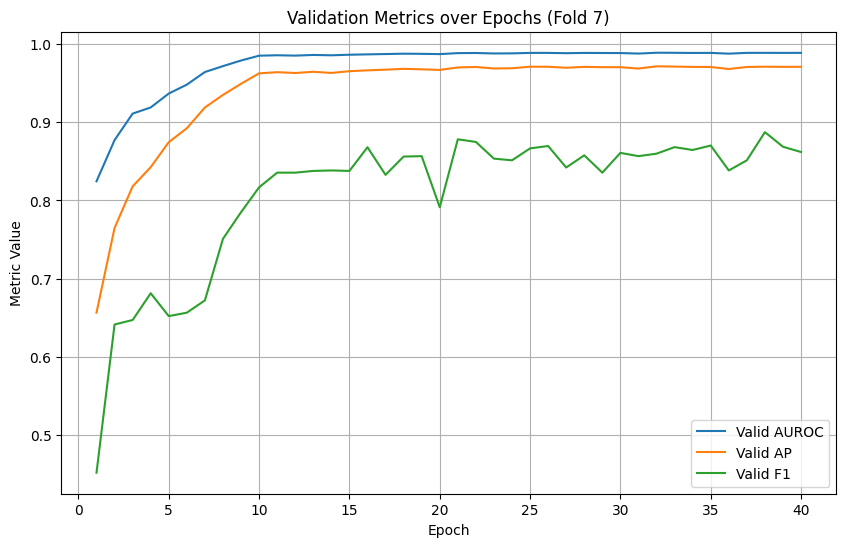


Fold 8/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027651 	Valid Loss 0.015924 	Valid AUROC 0.8054 	Valid AP 0.6425 	Valid F1 0.4626 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022798 	Valid Loss 0.013724 	Valid AUROC 0.8561 	Valid AP 0.7291 	Valid F1 0.5583 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020038 	Valid Loss 0.014186 	Valid AUROC 0.8895 	Valid AP 0.7873 	Valid F1 0.4804 	


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017525 	Valid Loss 0.014398 	Valid AUROC 0.9225 	Valid AP 0.8485 	Valid F1 0.5097 	


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016524 	Valid Loss 0.014106 	Valid AUROC 0.9384 	Valid AP 0.8755 	Valid F1 0.5429 	


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.014363 	Valid Loss 0.015394 	Valid AUROC 0.9517 	Valid AP 0.8966 	Valid F1 0.5194 	


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013090 	Valid Loss 0.015204 	Valid AUROC 0.9605 	Valid AP 0.9100 	Valid F1 0.5346 	


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.011403 	Valid Loss 0.014006 	Valid AUROC 0.9696 	Valid AP 0.9345 	Valid F1 0.6196 	


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010555 	Valid Loss 0.015001 	Valid AUROC 0.9699 	Valid AP 0.9314 	Valid F1 0.6154 	


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.009352 	Valid Loss 0.010209 	Valid AUROC 0.9790 	Valid AP 0.9504 	Valid F1 0.7530 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.008930 	Valid Loss 0.009834 	Valid AUROC 0.9775 	Valid AP 0.9488 	Valid F1 0.7769 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.008653 	Valid Loss 0.010013 	Valid AUROC 0.9795 	Valid AP 0.9519 	Valid F1 0.7606 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.008928 	Valid Loss 0.009212 	Valid AUROC 0.9799 	Valid AP 0.9519 	Valid F1 0.7922 	Best model for this fold -> saved


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.008396 	Valid Loss 0.010234 	Valid AUROC 0.9801 	Valid AP 0.9528 	Valid F1 0.7631 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.008456 	Valid Loss 0.011639 	Valid AUROC 0.9794 	Valid AP 0.9514 	Valid F1 0.7340 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.008360 	Valid Loss 0.011906 	Valid AUROC 0.9808 	Valid AP 0.9528 	Valid F1 0.7314 	


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.008639 	Valid Loss 0.010660 	Valid AUROC 0.9810 	Valid AP 0.9536 	Valid F1 0.7581 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.008673 	Valid Loss 0.012982 	Valid AUROC 0.9773 	Valid AP 0.9442 	Valid F1 0.6623 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.008381 	Valid Loss 0.009228 	Valid AUROC 0.9821 	Valid AP 0.9570 	Valid F1 0.7898 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.008227 	Valid Loss 0.011510 	Valid AUROC 0.9818 	Valid AP 0.9562 	Valid F1 0.7340 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.008430 	Valid Loss 0.009946 	Valid AUROC 0.9819 	Valid AP 0.9556 	Valid F1 0.7680 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.008346 	Valid Loss 0.009908 	Valid AUROC 0.9819 	Valid AP 0.9551 	Valid F1 0.7655 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.008075 	Valid Loss 0.009024 	Valid AUROC 0.9818 	Valid AP 0.9564 	Valid F1 0.8008 	Best model for this fold -> saved


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.008081 	Valid Loss 0.009012 	Valid AUROC 0.9828 	Valid AP 0.9585 	Valid F1 0.8101 	Best model for this fold -> saved


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.008176 	Valid Loss 0.011399 	Valid AUROC 0.9808 	Valid AP 0.9527 	Valid F1 0.7261 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.008473 	Valid Loss 0.007521 	Valid AUROC 0.9826 	Valid AP 0.9588 	Valid F1 0.8497 	Best model for this fold -> saved


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.008199 	Valid Loss 0.010819 	Valid AUROC 0.9812 	Valid AP 0.9546 	Valid F1 0.7480 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.007971 	Valid Loss 0.007861 	Valid AUROC 0.9832 	Valid AP 0.9596 	Valid F1 0.8405 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.008554 	Valid Loss 0.008867 	Valid AUROC 0.9825 	Valid AP 0.9581 	Valid F1 0.8101 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.008511 	Valid Loss 0.010706 	Valid AUROC 0.9815 	Valid AP 0.9550 	Valid F1 0.7621 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.008505 	Valid Loss 0.010992 	Valid AUROC 0.9805 	Valid AP 0.9526 	Valid F1 0.7510 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.007754 	Valid Loss 0.009530 	Valid AUROC 0.9822 	Valid AP 0.9568 	Valid F1 0.7826 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.008362 	Valid Loss 0.009286 	Valid AUROC 0.9815 	Valid AP 0.9557 	Valid F1 0.7922 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.008045 	Valid Loss 0.009452 	Valid AUROC 0.9824 	Valid AP 0.9574 	Valid F1 0.7802 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.008232 	Valid Loss 0.011011 	Valid AUROC 0.9810 	Valid AP 0.9549 	Valid F1 0.7495 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.007716 	Valid Loss 0.008350 	Valid AUROC 0.9825 	Valid AP 0.9581 	Valid F1 0.8333 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.008432 	Valid Loss 0.008708 	Valid AUROC 0.9832 	Valid AP 0.9593 	Valid F1 0.8222 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.008062 	Valid Loss 0.010311 	Valid AUROC 0.9819 	Valid AP 0.9572 	Valid F1 0.7646 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.008373 	Valid Loss 0.011266 	Valid AUROC 0.9813 	Valid AP 0.9548 	Valid F1 0.7340 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.007851 	Valid Loss 0.008465 	Valid AUROC 0.9832 	Valid AP 0.9601 	Valid F1 0.8260 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

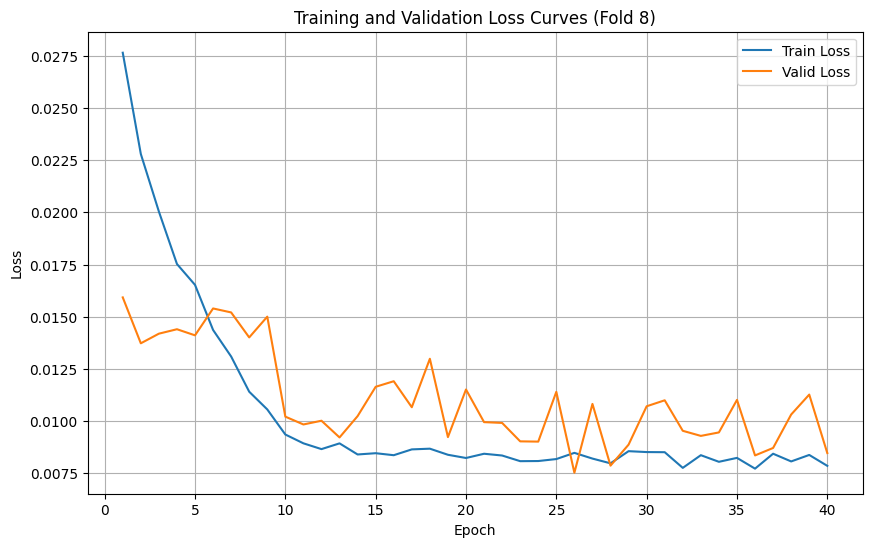

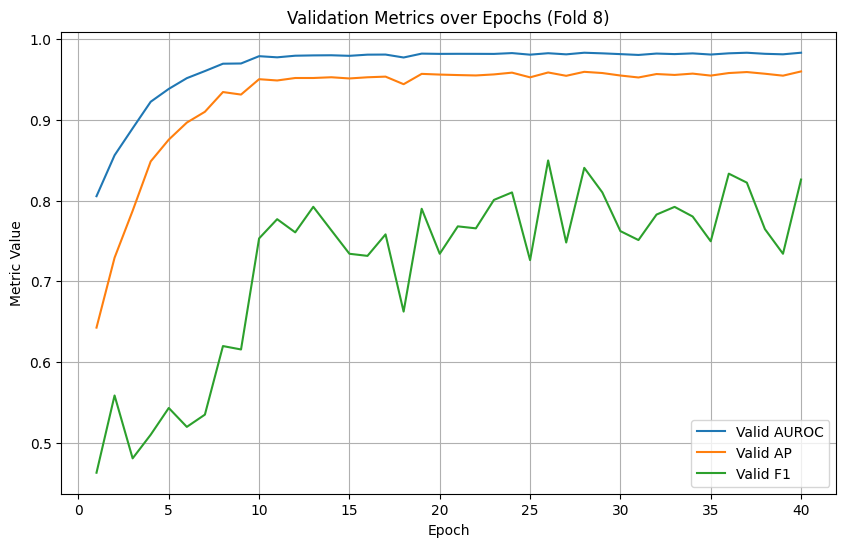


Fold 9/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.027247 	Valid Loss 0.016497 	Valid AUROC 0.7958 	Valid AP 0.6311 	Valid F1 0.5757 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.022417 	Valid Loss 0.013246 	Valid AUROC 0.8643 	Valid AP 0.7364 	Valid F1 0.6889 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.019681 	Valid Loss 0.011469 	Valid AUROC 0.9027 	Valid AP 0.8008 	Valid F1 0.7027 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.017591 	Valid Loss 0.010701 	Valid AUROC 0.9301 	Valid AP 0.8481 	Valid F1 0.7030 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.014814 	Valid Loss 0.011505 	Valid AUROC 0.9540 	Valid AP 0.8960 	Valid F1 0.6095 	


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.012561 	Valid Loss 0.011759 	Valid AUROC 0.9653 	Valid AP 0.9231 	Valid F1 0.6549 	


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.011113 	Valid Loss 0.011442 	Valid AUROC 0.9729 	Valid AP 0.9396 	Valid F1 0.6739 	


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.009873 	Valid Loss 0.007239 	Valid AUROC 0.9762 	Valid AP 0.9498 	Valid F1 0.8197 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.008348 	Valid Loss 0.006681 	Valid AUROC 0.9833 	Valid AP 0.9655 	Valid F1 0.8199 	Best model for this fold -> saved


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.007994 	Valid Loss 0.006355 	Valid AUROC 0.9845 	Valid AP 0.9685 	Valid F1 0.8377 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.007417 	Valid Loss 0.005940 	Valid AUROC 0.9843 	Valid AP 0.9682 	Valid F1 0.8593 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.007371 	Valid Loss 0.006467 	Valid AUROC 0.9856 	Valid AP 0.9703 	Valid F1 0.8419 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.007343 	Valid Loss 0.007509 	Valid AUROC 0.9856 	Valid AP 0.9704 	Valid F1 0.8187 	


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.007624 	Valid Loss 0.006633 	Valid AUROC 0.9860 	Valid AP 0.9708 	Valid F1 0.8352 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.006922 	Valid Loss 0.006106 	Valid AUROC 0.9870 	Valid AP 0.9733 	Valid F1 0.8609 	


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.007116 	Valid Loss 0.005394 	Valid AUROC 0.9866 	Valid AP 0.9721 	Valid F1 0.8686 	Best model for this fold -> saved


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.007254 	Valid Loss 0.006497 	Valid AUROC 0.9867 	Valid AP 0.9722 	Valid F1 0.8441 	


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.007063 	Valid Loss 0.006290 	Valid AUROC 0.9866 	Valid AP 0.9724 	Valid F1 0.8479 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.007031 	Valid Loss 0.006259 	Valid AUROC 0.9867 	Valid AP 0.9726 	Valid F1 0.8619 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.006796 	Valid Loss 0.005801 	Valid AUROC 0.9864 	Valid AP 0.9718 	Valid F1 0.8593 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.006773 	Valid Loss 0.006585 	Valid AUROC 0.9868 	Valid AP 0.9727 	Valid F1 0.8528 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.006831 	Valid Loss 0.005553 	Valid AUROC 0.9872 	Valid AP 0.9733 	Valid F1 0.8672 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.006917 	Valid Loss 0.006289 	Valid AUROC 0.9867 	Valid AP 0.9724 	Valid F1 0.8555 	


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.006883 	Valid Loss 0.006008 	Valid AUROC 0.9868 	Valid AP 0.9726 	Valid F1 0.8603 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.006787 	Valid Loss 0.006373 	Valid AUROC 0.9869 	Valid AP 0.9732 	Valid F1 0.8507 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.007148 	Valid Loss 0.006487 	Valid AUROC 0.9867 	Valid AP 0.9722 	Valid F1 0.8441 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.006738 	Valid Loss 0.006217 	Valid AUROC 0.9876 	Valid AP 0.9742 	Valid F1 0.8636 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.006898 	Valid Loss 0.006640 	Valid AUROC 0.9874 	Valid AP 0.9738 	Valid F1 0.8375 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.006806 	Valid Loss 0.006260 	Valid AUROC 0.9872 	Valid AP 0.9735 	Valid F1 0.8577 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.006951 	Valid Loss 0.006802 	Valid AUROC 0.9872 	Valid AP 0.9736 	Valid F1 0.8397 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.006429 	Valid Loss 0.005910 	Valid AUROC 0.9869 	Valid AP 0.9728 	Valid F1 0.8518 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.006303 	Valid Loss 0.005882 	Valid AUROC 0.9867 	Valid AP 0.9724 	Valid F1 0.8561 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.006921 	Valid Loss 0.006137 	Valid AUROC 0.9870 	Valid AP 0.9731 	Valid F1 0.8577 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.006812 	Valid Loss 0.006382 	Valid AUROC 0.9870 	Valid AP 0.9731 	Valid F1 0.8485 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.006897 	Valid Loss 0.006700 	Valid AUROC 0.9871 	Valid AP 0.9732 	Valid F1 0.8419 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.006740 	Valid Loss 0.005850 	Valid AUROC 0.9872 	Valid AP 0.9735 	Valid F1 0.8646 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.006630 	Valid Loss 0.005838 	Valid AUROC 0.9873 	Valid AP 0.9736 	Valid F1 0.8646 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.006564 	Valid Loss 0.006977 	Valid AUROC 0.9870 	Valid AP 0.9729 	Valid F1 0.8375 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.006856 	Valid Loss 0.006157 	Valid AUROC 0.9868 	Valid AP 0.9726 	Valid F1 0.8598 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.006508 	Valid Loss 0.005812 	Valid AUROC 0.9872 	Valid AP 0.9735 	Valid F1 0.8704 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

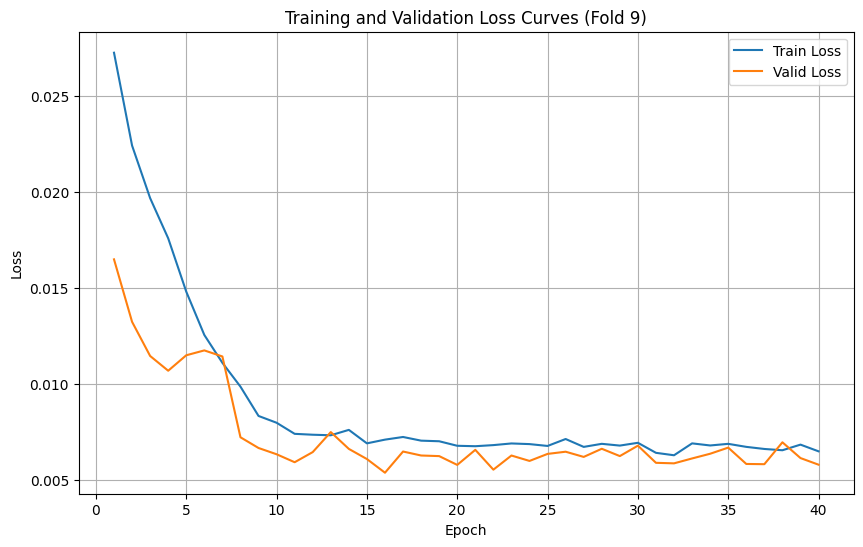

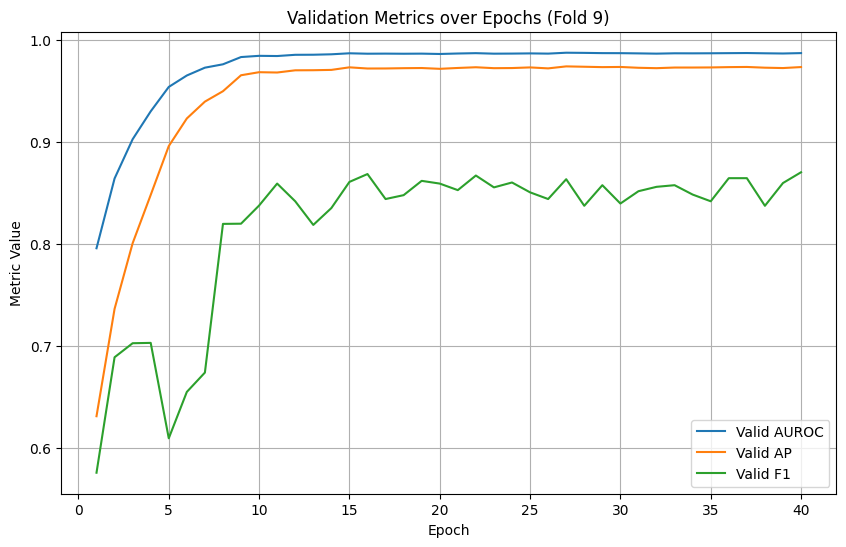


Fold 10/10


  0%|          | 0/40 [00:00<?, ?it/s]

Training Epoch  1:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  1:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  1: 	Train Loss 0.028215 	Valid Loss 0.016728 	Valid AUROC 0.8065 	Valid AP 0.5997 	Valid F1 0.4279 	Best model for this fold -> saved


Training Epoch  2:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  2:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  2: 	Train Loss 0.023459 	Valid Loss 0.014327 	Valid AUROC 0.8595 	Valid AP 0.7052 	Valid F1 0.5022 	Best model for this fold -> saved


Training Epoch  3:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  3:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  3: 	Train Loss 0.020541 	Valid Loss 0.013309 	Valid AUROC 0.9027 	Valid AP 0.7803 	Valid F1 0.5351 	Best model for this fold -> saved


Training Epoch  4:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  4:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  4: 	Train Loss 0.018056 	Valid Loss 0.012961 	Valid AUROC 0.9237 	Valid AP 0.8128 	Valid F1 0.5475 	Best model for this fold -> saved


Training Epoch  5:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  5:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  5: 	Train Loss 0.016471 	Valid Loss 0.011165 	Valid AUROC 0.9454 	Valid AP 0.8693 	Valid F1 0.6441 	Best model for this fold -> saved


Training Epoch  6:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  6:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  6: 	Train Loss 0.014950 	Valid Loss 0.013285 	Valid AUROC 0.9545 	Valid AP 0.8868 	Valid F1 0.5530 	


Training Epoch  7:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  7:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  7: 	Train Loss 0.013176 	Valid Loss 0.009086 	Valid AUROC 0.9637 	Valid AP 0.9091 	Valid F1 0.7364 	Best model for this fold -> saved


Training Epoch  8:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  8:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  8: 	Train Loss 0.012166 	Valid Loss 0.009053 	Valid AUROC 0.9691 	Valid AP 0.9226 	Valid F1 0.7356 	Best model for this fold -> saved


Training Epoch  9:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch  9:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch  9: 	Train Loss 0.010971 	Valid Loss 0.008150 	Valid AUROC 0.9726 	Valid AP 0.9322 	Valid F1 0.7818 	Best model for this fold -> saved


Training Epoch 10:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 10:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10: 	Train Loss 0.010360 	Valid Loss 0.007959 	Valid AUROC 0.9760 	Valid AP 0.9416 	Valid F1 0.7977 	Best model for this fold -> saved


Training Epoch 11:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 11:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11: 	Train Loss 0.009806 	Valid Loss 0.007919 	Valid AUROC 0.9759 	Valid AP 0.9410 	Valid F1 0.7947 	Best model for this fold -> saved


Training Epoch 12:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 12:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12: 	Train Loss 0.009835 	Valid Loss 0.008172 	Valid AUROC 0.9759 	Valid AP 0.9399 	Valid F1 0.7823 	


Training Epoch 13:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 13:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13: 	Train Loss 0.009069 	Valid Loss 0.007754 	Valid AUROC 0.9765 	Valid AP 0.9415 	Valid F1 0.8015 	Best model for this fold -> saved


Training Epoch 14:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 14:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14: 	Train Loss 0.009321 	Valid Loss 0.008848 	Valid AUROC 0.9755 	Valid AP 0.9381 	Valid F1 0.7440 	


Training Epoch 15:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 15:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15: 	Train Loss 0.009698 	Valid Loss 0.007673 	Valid AUROC 0.9784 	Valid AP 0.9453 	Valid F1 0.8060 	Best model for this fold -> saved


Training Epoch 16:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 16:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16: 	Train Loss 0.009520 	Valid Loss 0.008375 	Valid AUROC 0.9759 	Valid AP 0.9384 	Valid F1 0.7901 	


Training Epoch 17:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 17:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17: 	Train Loss 0.008846 	Valid Loss 0.006892 	Valid AUROC 0.9776 	Valid AP 0.9442 	Valid F1 0.8402 	Best model for this fold -> saved


Training Epoch 18:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 18:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18: 	Train Loss 0.008874 	Valid Loss 0.007262 	Valid AUROC 0.9782 	Valid AP 0.9439 	Valid F1 0.8222 	


Training Epoch 19:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 19:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19: 	Train Loss 0.009416 	Valid Loss 0.007968 	Valid AUROC 0.9779 	Valid AP 0.9430 	Valid F1 0.8015 	


Training Epoch 20:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 20:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20: 	Train Loss 0.009725 	Valid Loss 0.007258 	Valid AUROC 0.9790 	Valid AP 0.9465 	Valid F1 0.8294 	


Training Epoch 21:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 21:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21: 	Train Loss 0.009252 	Valid Loss 0.007495 	Valid AUROC 0.9787 	Valid AP 0.9451 	Valid F1 0.8250 	


Training Epoch 22:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 22:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22: 	Train Loss 0.009084 	Valid Loss 0.007467 	Valid AUROC 0.9780 	Valid AP 0.9428 	Valid F1 0.8163 	


Training Epoch 23:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 23:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23: 	Train Loss 0.009091 	Valid Loss 0.006879 	Valid AUROC 0.9786 	Valid AP 0.9448 	Valid F1 0.8427 	Best model for this fold -> saved


Training Epoch 24:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 24:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24: 	Train Loss 0.009254 	Valid Loss 0.007313 	Valid AUROC 0.9787 	Valid AP 0.9462 	Valid F1 0.8330 	


Training Epoch 25:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 25:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25: 	Train Loss 0.008923 	Valid Loss 0.008402 	Valid AUROC 0.9763 	Valid AP 0.9380 	Valid F1 0.7728 	


Training Epoch 26:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 26:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26: 	Train Loss 0.008798 	Valid Loss 0.006985 	Valid AUROC 0.9789 	Valid AP 0.9461 	Valid F1 0.8348 	


Training Epoch 27:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 27:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27: 	Train Loss 0.009165 	Valid Loss 0.006998 	Valid AUROC 0.9790 	Valid AP 0.9460 	Valid F1 0.8442 	


Training Epoch 28:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 28:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28: 	Train Loss 0.008823 	Valid Loss 0.007992 	Valid AUROC 0.9790 	Valid AP 0.9463 	Valid F1 0.7985 	


Training Epoch 29:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 29:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29: 	Train Loss 0.009114 	Valid Loss 0.007709 	Valid AUROC 0.9784 	Valid AP 0.9456 	Valid F1 0.8150 	


Training Epoch 30:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 30:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30: 	Train Loss 0.008975 	Valid Loss 0.007233 	Valid AUROC 0.9793 	Valid AP 0.9470 	Valid F1 0.8163 	


Training Epoch 31:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 31:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31: 	Train Loss 0.009001 	Valid Loss 0.007756 	Valid AUROC 0.9781 	Valid AP 0.9435 	Valid F1 0.8045 	


Training Epoch 32:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 32:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32: 	Train Loss 0.008704 	Valid Loss 0.006969 	Valid AUROC 0.9775 	Valid AP 0.9423 	Valid F1 0.8381 	


Training Epoch 33:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 33:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33: 	Train Loss 0.008750 	Valid Loss 0.007821 	Valid AUROC 0.9785 	Valid AP 0.9443 	Valid F1 0.7992 	


Training Epoch 34:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 34:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34: 	Train Loss 0.008818 	Valid Loss 0.007936 	Valid AUROC 0.9785 	Valid AP 0.9444 	Valid F1 0.7970 	


Training Epoch 35:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 35:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35: 	Train Loss 0.008806 	Valid Loss 0.007919 	Valid AUROC 0.9788 	Valid AP 0.9453 	Valid F1 0.8053 	


Training Epoch 36:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 36:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36: 	Train Loss 0.008825 	Valid Loss 0.007961 	Valid AUROC 0.9780 	Valid AP 0.9436 	Valid F1 0.8038 	


Training Epoch 37:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 37:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37: 	Train Loss 0.008968 	Valid Loss 0.006887 	Valid AUROC 0.9796 	Valid AP 0.9483 	Valid F1 0.8427 	


Training Epoch 38:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 38:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38: 	Train Loss 0.008860 	Valid Loss 0.007591 	Valid AUROC 0.9789 	Valid AP 0.9457 	Valid F1 0.8150 	


Training Epoch 39:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 39:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39: 	Train Loss 0.009407 	Valid Loss 0.007312 	Valid AUROC 0.9786 	Valid AP 0.9451 	Valid F1 0.8229 	


Training Epoch 40:   0%|          | 0/282 [00:00<?, ?it/s]

Evaluation Epoch 40:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40: 	Train Loss 0.009188 	Valid Loss 0.007680 	Valid AUROC 0.9796 	Valid AP 0.9485 	Valid F1 0.8158 	


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

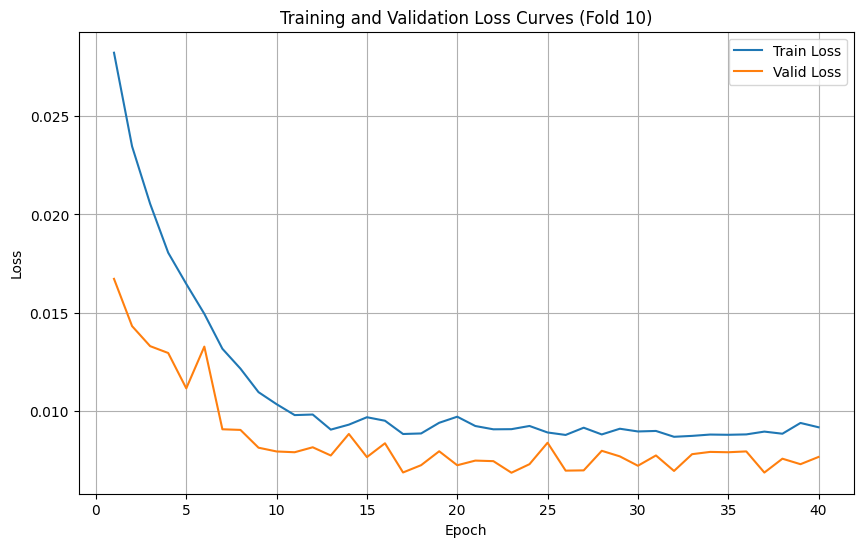

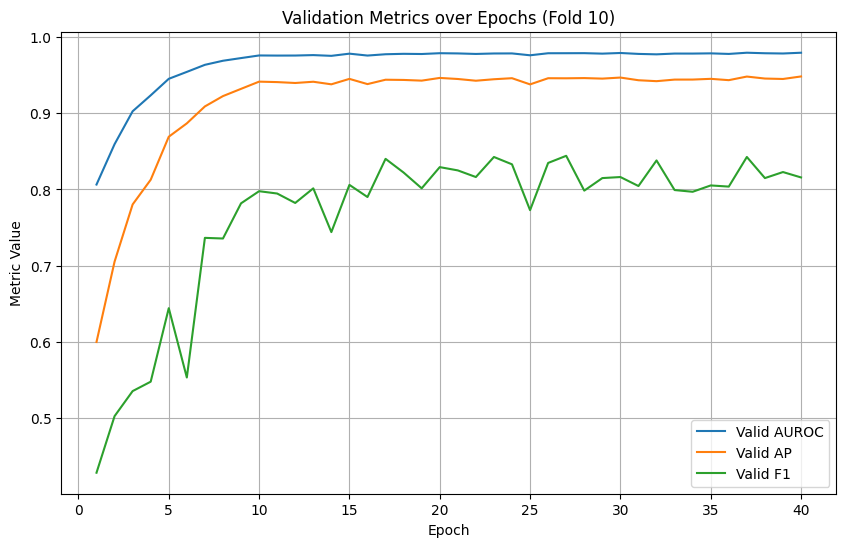

In [37]:
#added for stratified k-fold crossvalidation
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score
from sklearn.model_selection import StratifiedKFold
from torch.utils.data import WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.lr_scheduler import StepLR

# Define the number of folds
k_folds = 10

# Initialize StratifiedKFold
# We use labels.numpy().ravel() to get a 1D array of labels for stratification
skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=seed)

# Lists to store metrics for each fold
fold_auroc_all, fold_ap_all, fold_f1_all = [], [], []

# Iterate through the folds
for fold, (train_idx, valid_idx) in enumerate(skf.split(dataset, labels.numpy().ravel())):
    tqdm.write(f"\nFold {fold+1}/{k_folds}")

    # Get the subsets for the current fold
    train_subset = torch.utils.data.Subset(dataset, train_idx)
    valid_subset = torch.utils.data.Subset(dataset, valid_idx)

    # Calculate class weights for the current training subset for oversampling
    train_labels_fold = np.array([int(train_subset[i][1].item()) for i in range(len(train_subset))])
    class_weights_sampler_fold = compute_class_weight(class_weight='balanced', classes=np.unique(train_labels_fold), y=train_labels_fold)
    sample_weights_fold = [class_weights_sampler_fold[label] for label in train_labels_fold]
    sample_weights_fold = torch.tensor(sample_weights_fold, dtype=torch.float32)
    sampler_fold = WeightedRandomSampler(weights=sample_weights_fold, num_samples=len(sample_weights_fold), replacement=True)

    # Create DataLoaders for the current fold
    train_dataloader_fold = DataLoader(train_subset, batch_size=batch_size, sampler=sampler_fold)
    valid_dataloader_fold = DataLoader(valid_subset, batch_size=batch_size, shuffle=False) # No sampler for validation

    # Initialize a new model, optimizer, and scheduler for each fold
    model = CNNClassifier()
    model.to(device=device)
    # Ensure class_weights_sampler_fold is used for weighted loss for the current fold
    loss_function = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(class_weights_sampler_fold[1], dtype=torch.float32).to(device))
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    lr_scheduler = StepLR(optimizer, step_size=10, gamma=0.1)

    best_loss_fold = np.Inf
    train_loss_all_fold, valid_loss_all_fold = [], []
    valid_auroc_all_fold, valid_ap_all_fold, valid_f1_all_fold = [], [], []

    # Training and evaluation loop for the current fold
    for epoch in trange(1, num_epochs + 1):
        train_loss = train_loop(epoch, train_dataloader_fold, model, optimizer, loss_function, device)
        valid_loss, y_pred, y_true = eval_loop(epoch, valid_dataloader_fold, model, nn.BCEWithLogitsLoss(), device) # Use standard loss for validation

        train_loss_all_fold.append(train_loss)
        valid_loss_all_fold.append(valid_loss)

        valid_auroc = roc_auc_score(y_true, y_pred)
        valid_ap = average_precision_score(y_true, y_pred)
        valid_f1 = f1_score(y_true, (y_pred > 0.5).astype(int))

        valid_auroc_all_fold.append(valid_auroc)
        valid_ap_all_fold.append(valid_ap)
        valid_f1_all_fold.append(valid_f1)


        if valid_loss < best_loss_fold:
            # Optionally save the best model for this fold
            # torch.save({'model': model.state_dict()}, f'model_fold_{fold+1}.pth')
            best_loss_fold = valid_loss
            model_save_state = "Best model for this fold -> saved"
        else:
            model_save_state = ""

        tqdm.write('Epoch {epoch:2d}: \t'
                    'Train Loss {train_loss:.6f} \t'
                    'Valid Loss {valid_loss:.6f} \t'
                    'Valid AUROC {valid_auroc:.4f} \t'
                    'Valid AP {valid_ap:.4f} \t'
                    'Valid F1 {valid_f1:.4f} \t'
                    '{model_save}'
                    .format(epoch=epoch,
                            train_loss=train_loss,
                            valid_loss=valid_loss,
                            valid_auroc=valid_auroc,
                            valid_ap=valid_ap,
                            valid_f1=valid_f1,
                            model_save=model_save_state)
                        )

        if lr_scheduler:
            lr_scheduler.step()

    # Store the best metrics from this fold
    best_epoch_idx = np.argmin(valid_loss_all_fold)
    fold_auroc_all.append(valid_auroc_all_fold[best_epoch_idx])
    fold_ap_all.append(valid_ap_all_fold[best_epoch_idx])
    fold_f1_all.append(valid_f1_all_fold[best_epoch_idx])

    # Plot learning curves for the current fold
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), train_loss_all_fold, label='Train Loss')
    plt.plot(range(1, num_epochs + 1), valid_loss_all_fold, label='Valid Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss Curves (Fold {fold+1})')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot validation metrics for the current fold
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), valid_auroc_all_fold, label='Valid AUROC')
    plt.plot(range(1, num_epochs + 1), valid_ap_all_fold, label='Valid AP')
    plt.plot(range(1, num_epochs + 1), valid_f1_all_fold, label='Valid F1')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title(f'Validation Metrics over Epochs (Fold {fold+1})')
    plt.legend()
    plt.grid(True)
    plt.show()

In [43]:
# Examine the stored metrics for each fold
print("Performance metrics for each fold:")
for i, (auroc, ap, f1) in enumerate(zip(fold_auroc_all, fold_ap_all, fold_f1_all)):
    print(f"Fold {i+1}: AUROC={auroc:.4f}, AP={ap:.4f}, F1={f1:.4f}")

# Find the index of the best performing fold based on F1 score
best_fold_index = np.argmax(fold_f1_all)
best_f1_score = fold_f1_all[best_fold_index]
best_auroc_score = fold_auroc_all[best_fold_index]
best_ap_score = fold_ap_all[best_fold_index]

print(f"\nBest performing fold based on F1 score: Fold {best_fold_index + 1}")
print(f"Best F1 Score: {best_f1_score:.4f}")
print(f"Corresponding AUROC: {best_auroc_score:.4f}")
print(f"Corresponding AP: {best_ap_score:.4f}")

Performance metrics for each fold:
Fold 1: AUROC=0.9902, AP=0.9722, F1=0.9142
Fold 2: AUROC=0.8667, AP=0.7220, F1=0.3817
Fold 3: AUROC=0.9838, AP=0.9691, F1=0.9197
Fold 4: AUROC=0.9740, AP=0.9424, F1=0.8340
Fold 5: AUROC=0.9891, AP=0.9709, F1=0.9167
Fold 6: AUROC=0.9808, AP=0.9493, F1=0.9026
Fold 7: AUROC=0.9882, AP=0.9699, F1=0.8781
Fold 8: AUROC=0.9826, AP=0.9588, F1=0.8497
Fold 9: AUROC=0.9866, AP=0.9721, F1=0.8686
Fold 10: AUROC=0.9786, AP=0.9448, F1=0.8427

Best performing fold based on F1 score: Fold 3
Best F1 Score: 0.9197
Corresponding AUROC: 0.9838
Corresponding AP: 0.9691


---
## Model Testing

Since we saved our best model, we can now load the trained model and make predictions on the test data set. We save the predictions in a csv file which will be uploaded as part of the deliverables. Note that we take a `Sigmoid()` function on the model prediction in order to obtain soft predictions (probabilities) instead of hard predictions (0s or 1s).

### Coding Task 7: Make prediction for test data

Here you do not really need to code but you have to:
- replace the baseline model with your model. If you do not use colab then change the path to the model location to load the trained model)
- run the script. The predictions are saved in the variable `soft_pred`.
- upload your predictions to the leaderboard online (see instruction details below).

In [38]:
# build the dataloader once and re-use when running the cell below possibly multiple times.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# =============== Build data loaders ==========================================#
tqdm.write("Building data loaders...")
# load data
path_to_h5_test, path_to_csv_test = 'codesubset/test.h5', 'codesubset/test.csv'
traces = torch.tensor(h5py.File(path_to_h5_test, 'r')['tracings'][()], dtype=torch.float32)
dataset = TensorDataset(traces)
len_dataset = len(dataset)
# build data loaders
test_dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
tqdm.write("Done!\n")

Building data loaders...
Done!



In [39]:
# =============== Define model ================================================#
tqdm.write("Define model...")
"""
TASK: Replace the baseline model with your model; Insert your code here
"""
# model = ModelBaseline()
model = CNNClassifier()

# load stored model parameters
ckpt = torch.load('model.pth', map_location=lambda storage, loc: storage)
model.load_state_dict(ckpt['model'])
# put model on device
model.to(device=device)
tqdm.write("Done!\n")

# =============== Evaluate model ==============================================#
model.eval()
# allocation
test_pred = torch.zeros(len_dataset,1)
# progress bar def
test_pbar = tqdm(test_dataloader, desc="Testing")
# evaluation loop
end=0
for traces in test_pbar:
    # data to device
    traces = traces[0].to(device)
    start = end
    with torch.no_grad():
        # Forward pass
        model_output = model(traces)

        # store output
        end = min(start + len(model_output), test_pred.shape[0])
        test_pred[start:end] = torch.nn.Sigmoid()(model_output).detach().cpu()

test_pbar.close()

# =============== Save predictions ============================================#
soft_pred = np.stack((1-test_pred.numpy(), test_pred.numpy()),axis=1).squeeze()

Define model...
Done!



Testing:   0%|          | 0/188 [00:00<?, ?it/s]

To upload your predictions to the leaderboard, use the following code. There are the following steps to follow:
1. Download the GitHub repository for the leaderboard submission system.
2. Register your team with a **team id** and **password**. The password ensures that only your team can upload to your team id. Do only run the registration once.
3. Upload you predictions as a new submission. There are some things to obey here:
    - For each submission you have to attach a note for you to keep track of the submission in the leaderboard and for us to know which submission you refer to in your explanation. Choose something meaningful such as "submission A" or "model B".
    - You can only get one prediction evaluated per day and you get the score the following day. If you do multiple submissions on the same day, the initial submission will be overwritten and thus only the final submission will be evaluated.
    - Only a maximum of ***FIVE*** submissions will be evaluated. So make them count! (If you update an submission before it is evaluated it doesn't count)
    - The evaluation score is published with you team_id and note at http://hyperion.it.uu.se:5050/leaderboard



In [40]:
# 1. Download repository for leaderboard submission system
if not exists('leaderboard'):
    !git clone https://gist.github.com/3ff6c4c867331c0bf334301842d753c7.git leaderboard

Cloning into 'leaderboard'...
remote: Enumerating objects: 3, done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 3 (from 1)
Receiving objects: 100% (3/3), done.


In [41]:
# 2. Registration of your team
host = "http://hyperion.it.uu.se:5050/"
runfile("leaderboard/leaderboard_helpers.py")

"""
TASK: Decide for a team_id (max 20 chars) and password.
Do not change this after you have registered your team
"""
team_id = 'LundBooster' #Fill in a string
password = 'LundBooster' #Fill in a string

# run the registration
r = register_team(team_id, password)
if (r.status_code == 201):
    print("Team registered successfully! Good luck")
elif not (r.status_code == 200):
    raise Exception("You can not change your password once created. If you need help, please contact the teachers")

Team registered successfully! Good luck


In [42]:
# 3. Upload the prediction as submission

# Write a note about the training procedure so you can identify it in the leaderboard. e.g. 5 epochs, or First  (Max 20 characters)
"""
TASK: Add a note for you submission
"""
note = 'Classifier-Debut' #Fill in a string

# Submit the predictions to the leaderboard. Note, this also saves your submissions in your colab folder
r = submit(team_id, password, soft_pred.tolist(), note)
if r.status_code == 201:
    print("Submission successful!")
elif r.status_code == 200:
    print("Submission updated!")

Submission successful!


### Explanation Task 4: Submissions
One of the grading criteria are three submissions to the leaderboard. List the three main submissions in the table below and explain the main changes in your code for each submission.

<br />


**<font color='red'>Your explanation here:</font>**

Your team id: **<font color='red'>Fill in</font>**

| Submission note | Accuracy | F1 | AUC | AP | Submission description |
| --------------- | -------- | -- | --  | -- | ---------------------- |
|xxx              | 0        | 0  | 0   | 0  | desc                   |
|xxx              | 0        | 0  | 0   | 0  | desc                   |
|xxx              | 0        | 0  | 0   | 0  | desc                   |

### Explanation Task 5: Reflection on Metrics
Your were asked to reach a certain value in AUC and AP while maximising F1 for the leaderboard position. Explain in bullet points what aspect each of the metrics covers and why it is important not to just focus on one metric. What can happen if you only focus on AUC for example?

<br />

**<font color='red'>Your explanation here:</font>**